<a href="https://colab.research.google.com/github/sergioGarcia91/ML_and_EDA/blob/main/10a_CalidadAire_RegresionLineal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modelo de Regresión Lineal - Dataset: calidadDelAire_2016_2020.csv


> *Ser tan rápidos como el más lento, \
> y ser tan lentos como el más rápido.*

**Autores:**
- Benjamin Espinosa Pérez
- John Herman Mantilla Hernandez
- Pedro Alejandro Garnica Rueda
- Sergio Andrés García Arias  

**Versión 01:** Noviembre 2024

# 1 Introducción

En este Notebook se presenta un análisis de los datos descargados del portal del Área Metropolitana de Bucaramanga (AMB), enfocados en la calidad del aire.  

> *La información está disponible en: [AMB - Calidad del Aire](https://www.amb.gov.co/calidad-del-aire/)*  

Durante la revisión del catálogo, se identificó una ausencia significativa de información en la temporalidad del catálogo, comprendida entre 2016 y 2020, particularmente en las columnas relacionadas con la cantidad de partículas en el aire. Por esta razón, se decidió centrar el análisis en las variables de temperatura y humedad para seleccionar la variable objetivo de predicción.  

# 2 Justificación

La selección de estas columnas se basa en la evidencia de una correlación lineal entre ambas, lo que respalda su uso en posibles modelos de predicción. En este análisis, se establece la temperatura como la variable de interés, ya que el clima es un factor clave en diversas actividades humanas. Conocer sus posibles variaciones resulta esencial para el control de cultivos, la gestión de animales y el bienestar de la población en general.

# 4 Cargue de datos

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
path = 'https://github.com/sergioGarcia91/ML_and_EDA/raw/refs/heads/main/Datasets/calidadDelAire_2016_2020.csv'
df = pd.read_csv(path, sep=';', decimal=',')

df.head()

,Unnamed: 0,EST. LAGOS I F/BLANCA PM10,"EST. LAGOS I F/BLANCA PM2,5",EST. LAGOS I F/BLANCA NO2,EST. LAGOS I F/BLANCA O3,EST. LACIUDADELA PM10,"EST. LACIUDADELA PM2,5",EST. LACIUDADELA NO2,EST. LACIUDADELA O3,EST. SANTA CRUZ GIRÓN PM10,...,EST. SAN FRANCISCO HUMEDAD,EST. SAN FRANCISCO DIR. VIENTO,EST. SAN FRANCISCO VEL.VIENTO,EST. SAN FRANCISCO RAD. SOLAR,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE LLUVIA,EST. LAGOS DEL CACIQUE HUMEDAD,EST. LAGOS DEL CACIQUE DIR. VIENTO,EST. LAGOS DEL CACIQUE VEL.VIENTO,EST. LAGOS DEL CACIQUE RAD. SOLAR
0,01/10/2018 00:00,NaN,NaN,NaN,NaN,23.8,12.1,23.8128,3.4,13.5,...,80.2,126.2,1.0,0.0,22.2,0.1,83.5,290.6,NaN,0.0
1,01/10/2018 01:00,NaN,NaN,NaN,NaN,14.6,7.5,1.2628,17.5,12.7,...,88.0,124.6,1.1,0.0,21.7,0.0,89.8,109.9,NaN,0.0
2,01/10/2018 02:00,NaN,NaN,NaN,NaN,14.5,7.7,12.6280,7.2,16.2,...,87.0,134.8,1.1,0.0,21.7,0.0,86.8,350.4,NaN,0.0
3,01/10/2018 03:00,NaN,NaN,NaN,NaN,16.6,7.9,13.3496,NaN,16.3,...,83.1,140.6,0.8,0.0,21.6,0.0,84.9,258.3,NaN,0.0
4,01/10/2018 04:00,NaN,NaN,NaN,NaN,18.3,9.5,8.4788,3.6,15.1,...,90.8,177.5,1.0,0.0,20.7,0.0,91.7,170.6,1.0,0.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17904 entries, 0 to 17903
Data columns (total 45 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Unnamed: 0                          17904 non-null  object 
 1   EST. LAGOS I F/BLANCA PM10          10730 non-null  float64
 2   EST. LAGOS I F/BLANCA PM2,5         13750 non-null  float64
 3   EST. LAGOS I F/BLANCA NO2           9717 non-null   float64
 4   EST. LAGOS I F/BLANCA O3            9833 non-null   float64
 5   EST. LACIUDADELA PM10               13604 non-null  float64
 6   EST. LACIUDADELA PM2,5              14279 non-null  float64
 7   EST. LACIUDADELA NO2                12681 non-null  float64
 8   EST. LACIUDADELA O3                 13603 non-null  float64
 9   EST. SANTA CRUZ GIRÓN PM10          15833 non-null  float64
 10  EST. SANTA CRUZ GIRÓN PM2,5         17233 non-null  float64
 11  EST. SAN FRANCISCO PM10             16937

# 5 Exploración de datos

In [ ]:
df.describe().round(2)

,EST. LAGOS I F/BLANCA PM10,"EST. LAGOS I F/BLANCA PM2,5",EST. LAGOS I F/BLANCA NO2,EST. LAGOS I F/BLANCA O3,EST. LACIUDADELA PM10,"EST. LACIUDADELA PM2,5",EST. LACIUDADELA NO2,EST. LACIUDADELA O3,EST. SANTA CRUZ GIRÓN PM10,"EST. SANTA CRUZ GIRÓN PM2,5",...,EST. SAN FRANCISCO HUMEDAD,EST. SAN FRANCISCO DIR. VIENTO,EST. SAN FRANCISCO VEL.VIENTO,EST. SAN FRANCISCO RAD. SOLAR,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE LLUVIA,EST. LAGOS DEL CACIQUE HUMEDAD,EST. LAGOS DEL CACIQUE DIR. VIENTO,EST. LAGOS DEL CACIQUE VEL.VIENTO,EST. LAGOS DEL CACIQUE RAD. SOLAR
count,10730.00,13750.00,9717.00,9833.00,13604.00,14279.00,12681.00,13603.00,15833.00,17233.00,...,16920.00,14603.00,14603.00,16920.00,16037.00,17059.00,17060.00,14537.00,14342.00,17060.00
mean,35.27,16.98,18.27,29.40,30.49,16.45,15.56,24.49,39.94,18.49,...,69.22,264.04,1.45,195.46,24.59,0.08,69.65,245.21,1.11,183.64
std,21.34,14.56,11.50,26.16,16.42,11.10,11.26,24.77,25.81,14.42,...,12.61,83.34,0.92,272.04,3.10,0.77,13.44,103.96,0.79,257.57
min,3.40,1.30,0.18,0.10,0.80,0.40,0.00,0.00,2.60,0.70,...,25.70,0.20,0.10,0.00,14.40,0.00,24.90,0.00,0.00,0.00
25%,19.70,8.10,10.28,7.70,18.60,8.90,6.67,6.10,21.10,8.50,...,59.80,226.85,0.70,0.00,22.10,0.00,59.40,166.40,0.50,0.00
50%,28.30,12.00,15.69,21.70,26.60,13.50,13.53,16.90,32.40,14.30,...,70.80,304.20,1.10,3.20,24.00,0.00,72.50,296.70,0.90,2.45
75%,45.70,20.38,23.99,44.30,38.40,20.40,21.65,32.90,51.90,22.80,...,79.40,322.50,2.00,371.50,26.90,0.00,80.40,329.50,1.60,342.80
max,157.00,128.00,90.02,142.10,168.30,111.30,106.80,139.80,194.80,106.90,...,96.00,360.00,4.50,1053.30,34.80,26.50,96.70,360.00,4.40,1047.40


## 6 Varianza

In [ ]:
df.iloc[:, 1:].var().round(2)

,0
EST. LAGOS I F/BLANCA PM10,455.31
"EST. LAGOS I F/BLANCA PM2,5",212.11
EST. LAGOS I F/BLANCA NO2,132.32
EST. LAGOS I F/BLANCA O3,684.12
EST. LACIUDADELA PM10,269.57
"EST. LACIUDADELA PM2,5",123.26
EST. LACIUDADELA NO2,126.69
EST. LACIUDADELA O3,613.54
EST. SANTA CRUZ GIRÓN PM10,666.21
"EST. SANTA CRUZ GIRÓN PM2,5",207.86


## 7 Correlación de Pearson

In [ ]:
corr = df.iloc[:, 1:].corr(method='pearson')

# Calcular la correlación media absoluta para cada variable
corr_mean = corr.abs().mean().sort_values(ascending=False)

# Reordenar las columnas y filas de la matriz de correlación según la correlación media
ordered_corr = corr.loc[corr_mean.index, corr_mean.index]

corr.round(2)

,EST. LAGOS I F/BLANCA PM10,"EST. LAGOS I F/BLANCA PM2,5",EST. LAGOS I F/BLANCA NO2,EST. LAGOS I F/BLANCA O3,EST. LACIUDADELA PM10,"EST. LACIUDADELA PM2,5",EST. LACIUDADELA NO2,EST. LACIUDADELA O3,EST. SANTA CRUZ GIRÓN PM10,"EST. SANTA CRUZ GIRÓN PM2,5",...,EST. SAN FRANCISCO HUMEDAD,EST. SAN FRANCISCO DIR. VIENTO,EST. SAN FRANCISCO VEL.VIENTO,EST. SAN FRANCISCO RAD. SOLAR,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE LLUVIA,EST. LAGOS DEL CACIQUE HUMEDAD,EST. LAGOS DEL CACIQUE DIR. VIENTO,EST. LAGOS DEL CACIQUE VEL.VIENTO,EST. LAGOS DEL CACIQUE RAD. SOLAR
EST. LAGOS I F/BLANCA PM10,1.00,0.93,-0.07,0.10,0.78,0.89,-0.18,0.04,0.82,0.79,...,-0.24,0.00,0.05,0.03,0.18,-0.03,-0.19,0.07,0.01,0.01
"EST. LAGOS I F/BLANCA PM2,5",0.93,1.00,-0.04,0.15,0.75,0.90,-0.18,0.13,0.78,0.86,...,-0.21,0.01,0.03,0.03,0.15,-0.01,-0.17,0.04,0.01,0.02
EST. LAGOS I F/BLANCA NO2,-0.07,-0.04,1.00,-0.17,0.07,0.03,0.50,0.10,0.21,-0.03,...,0.08,-0.00,-0.01,-0.19,-0.08,-0.03,0.11,0.03,0.07,-0.19
EST. LAGOS I F/BLANCA O3,0.10,0.15,-0.17,1.00,0.04,0.09,-0.41,0.82,-0.03,0.07,...,-0.63,-0.01,-0.01,0.70,0.76,-0.00,-0.70,0.07,0.01,0.70
EST. LACIUDADELA PM10,0.78,0.75,0.07,0.04,1.00,0.90,0.11,0.07,0.76,0.79,...,-0.20,0.00,-0.01,-0.02,0.06,-0.05,-0.14,0.04,-0.00,-0.03
"EST. LACIUDADELA PM2,5",0.89,0.90,0.03,0.09,0.90,1.00,0.04,0.10,0.79,0.89,...,-0.13,0.02,0.01,-0.06,0.05,-0.02,-0.09,0.06,0.01,-0.06
EST. LACIUDADELA NO2,-0.18,-0.18,0.50,-0.41,0.11,0.04,1.00,-0.39,0.20,-0.01,...,0.29,-0.01,-0.01,-0.36,-0.38,-0.03,0.36,0.04,0.06,-0.36
EST. LACIUDADELA O3,0.04,0.13,0.10,0.82,0.07,0.10,-0.39,1.00,0.13,0.15,...,-0.52,-0.02,-0.03,0.50,0.59,-0.02,-0.56,0.09,0.01,0.51
EST. SANTA CRUZ GIRÓN PM10,0.82,0.78,0.21,-0.03,0.76,0.79,0.20,0.13,1.00,0.91,...,-0.08,-0.01,-0.01,-0.11,-0.01,-0.03,-0.04,0.07,0.03,-0.11
"EST. SANTA CRUZ GIRÓN PM2,5",0.79,0.86,-0.03,0.07,0.79,0.89,-0.01,0.15,0.91,1.00,...,-0.10,-0.01,0.01,-0.09,0.02,-0.01,-0.05,0.05,0.03,-0.08


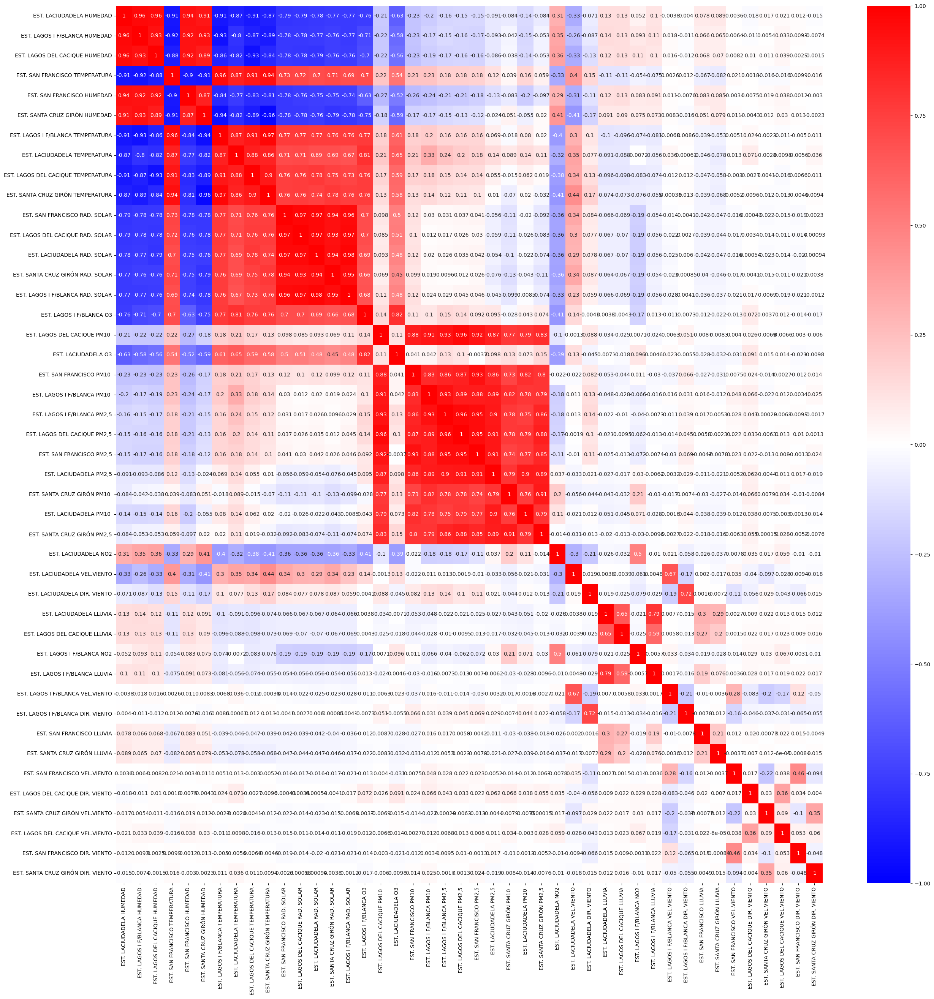

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(ordered_corr,
            annot=True,
            cmap='bwr',
            vmin=-1,
            vmax=1)
plt.show()

La humedad, la temperatura y radiación solar parecen tener una correlación fuerte entre sí. Del mismo modo, el material particulado PM muestra correlación entre sus propias mediciones. A continuación, se procederá a evaluar la cantidad de valores no nulos presentes en estas variables, o sea los que mas información tienen.

## Valores No nulos

In [ ]:
# Contar los valores no nulos por columna
non_null_counts = df.iloc[:,1:].count()
non_null_counts = non_null_counts.sort_values(ascending=False)
non_null_counts

,0
EST. SANTA CRUZ GIRÓN HUMEDAD,17711
EST. SANTA CRUZ GIRÓN LLUVIA,17711
EST. SANTA CRUZ GIRÓN TEMPERATURA,17709
EST. SANTA CRUZ GIRÓN RAD. SOLAR,17690
"EST. SANTA CRUZ GIRÓN PM2,5",17233
EST. LAGOS DEL CACIQUE RAD. SOLAR,17060
EST. LAGOS DEL CACIQUE HUMEDAD,17060
EST. LAGOS DEL CACIQUE LLUVIA,17059
EST. LACIUDADELA LLUVIA,17053
EST. LACIUDADELA RAD. SOLAR,17053


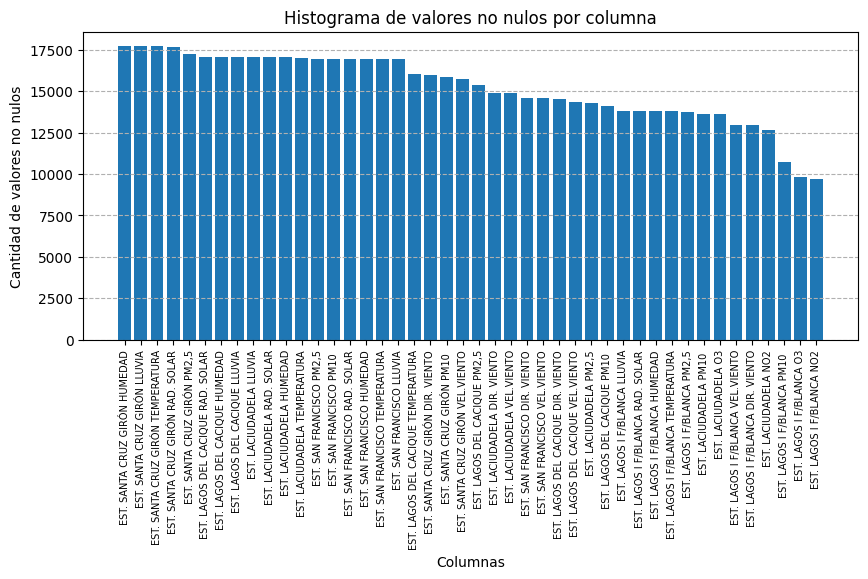

In [ ]:
# Crear el histograma
plt.figure(figsize=(10, 4))
plt.bar(non_null_counts.index, non_null_counts.values)
plt.xlabel('Columnas')
# Inclinación de las etiquetas del eje X
plt.xticks(rotation=90, fontsize=7)
plt.ylabel('Cantidad de valores no nulos')
plt.title('Histograma de valores no nulos por columna')
plt.grid(ls='--', axis='y')
plt.show()

La estación de Girón se confirma nuevamente como la que cuenta con la mayor cantidad de datos o valores no nulos, mientras que la estación Lagos I en Floridablanca presenta una mayor ausencia de información.

## Temporalidad todos

Se procederá a graficar la temporalidad o las variaciones de los datos, tomando en cuenta la columna de fecha disponible.

In [ ]:
df_Temp =  df.copy()
df_Temp['Unnamed: 0'] = pd.to_datetime(df_Temp['Unnamed: 0'], dayfirst=True)

df_Temp.head()

,Unnamed: 0,EST. LAGOS I F/BLANCA PM10,"EST. LAGOS I F/BLANCA PM2,5",EST. LAGOS I F/BLANCA NO2,EST. LAGOS I F/BLANCA O3,EST. LACIUDADELA PM10,"EST. LACIUDADELA PM2,5",EST. LACIUDADELA NO2,EST. LACIUDADELA O3,EST. SANTA CRUZ GIRÓN PM10,...,EST. SAN FRANCISCO HUMEDAD,EST. SAN FRANCISCO DIR. VIENTO,EST. SAN FRANCISCO VEL.VIENTO,EST. SAN FRANCISCO RAD. SOLAR,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE LLUVIA,EST. LAGOS DEL CACIQUE HUMEDAD,EST. LAGOS DEL CACIQUE DIR. VIENTO,EST. LAGOS DEL CACIQUE VEL.VIENTO,EST. LAGOS DEL CACIQUE RAD. SOLAR
0,2018-10-01 00:00:00,NaN,NaN,NaN,NaN,23.8,12.1,23.8128,3.4,13.5,...,80.2,126.2,1.0,0.0,22.2,0.1,83.5,290.6,NaN,0.0
1,2018-10-01 01:00:00,NaN,NaN,NaN,NaN,14.6,7.5,1.2628,17.5,12.7,...,88.0,124.6,1.1,0.0,21.7,0.0,89.8,109.9,NaN,0.0
2,2018-10-01 02:00:00,NaN,NaN,NaN,NaN,14.5,7.7,12.6280,7.2,16.2,...,87.0,134.8,1.1,0.0,21.7,0.0,86.8,350.4,NaN,0.0
3,2018-10-01 03:00:00,NaN,NaN,NaN,NaN,16.6,7.9,13.3496,NaN,16.3,...,83.1,140.6,0.8,0.0,21.6,0.0,84.9,258.3,NaN,0.0
4,2018-10-01 04:00:00,NaN,NaN,NaN,NaN,18.3,9.5,8.4788,3.6,15.1,...,90.8,177.5,1.0,0.0,20.7,0.0,91.7,170.6,1.0,0.0


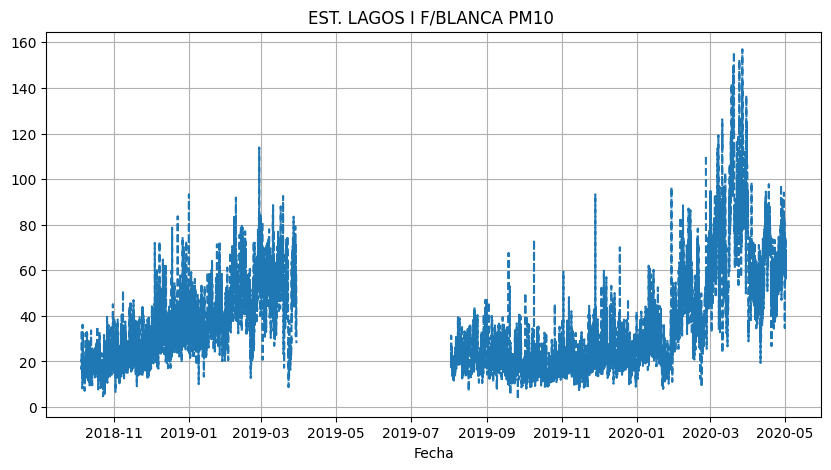

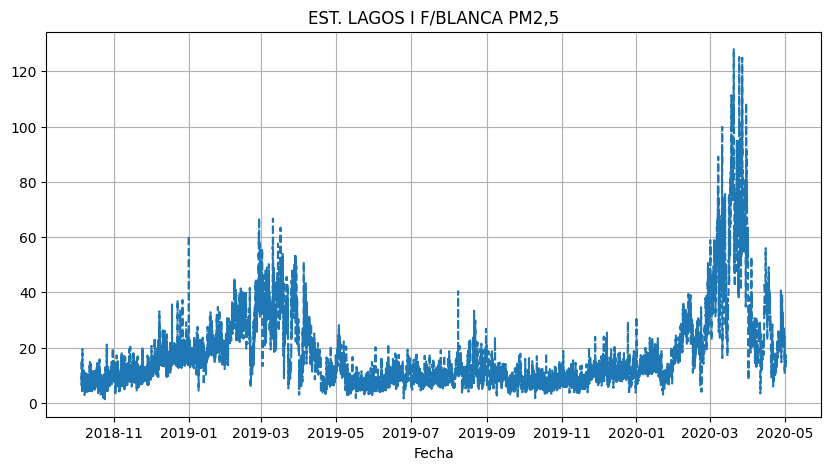

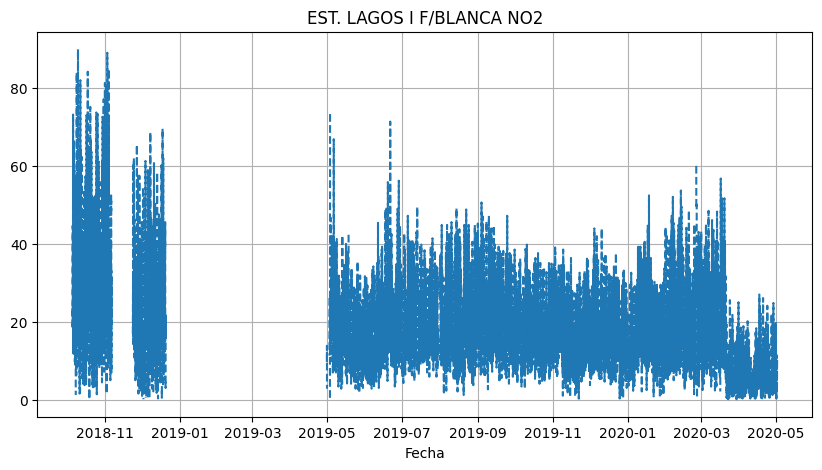

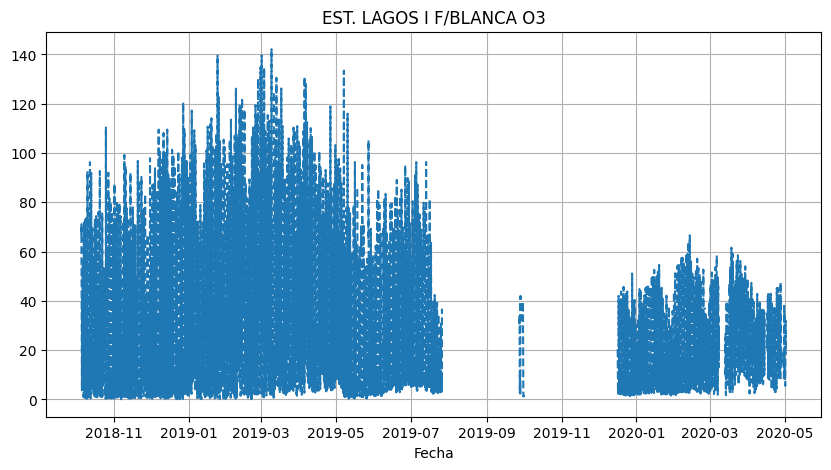

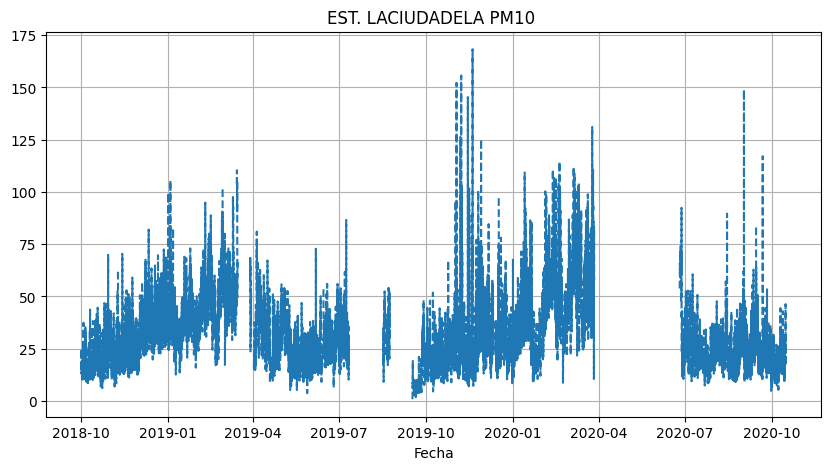

...

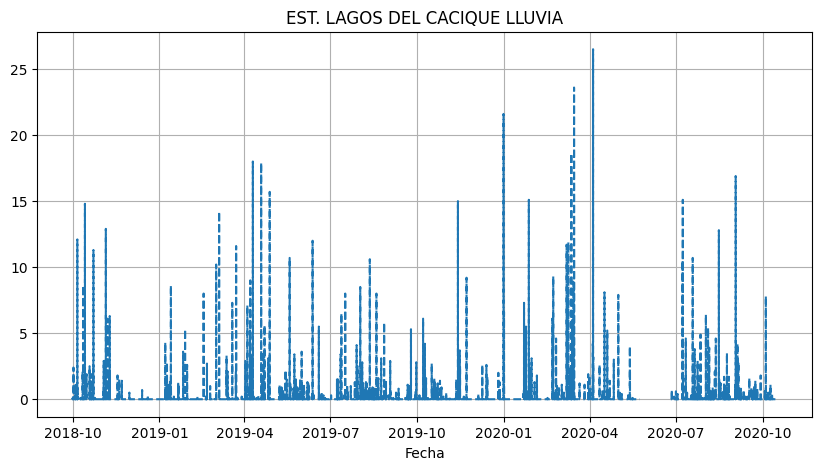

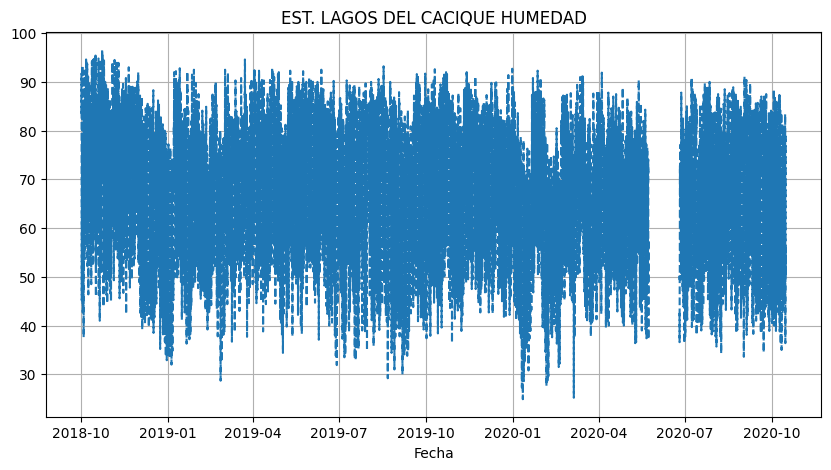

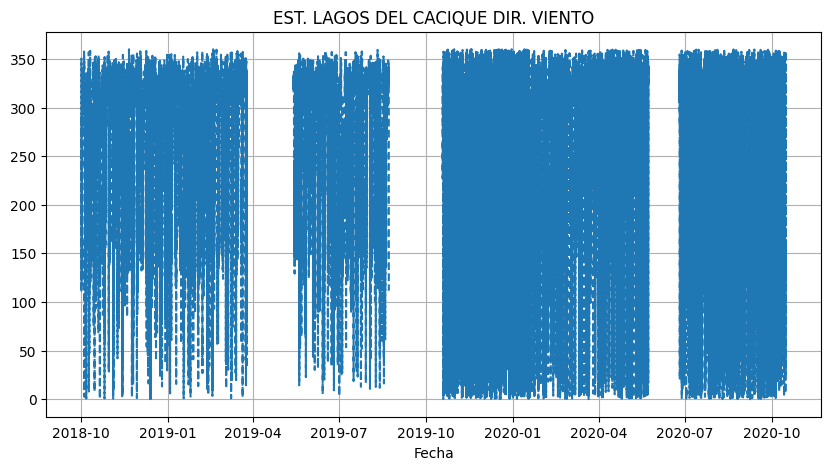

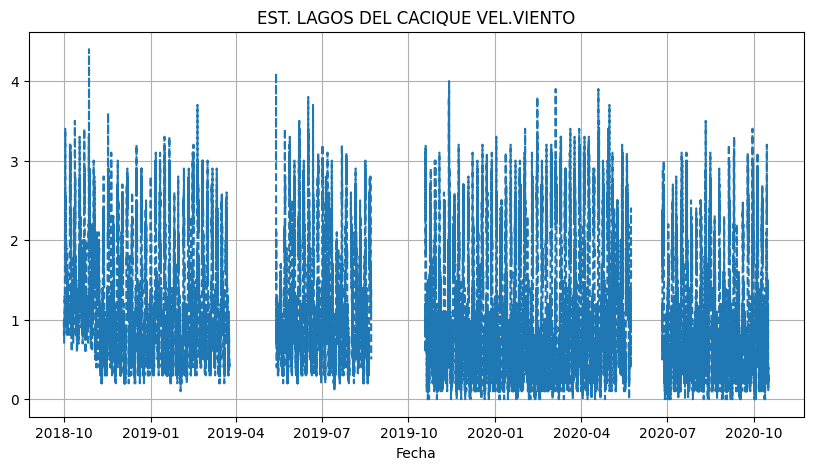

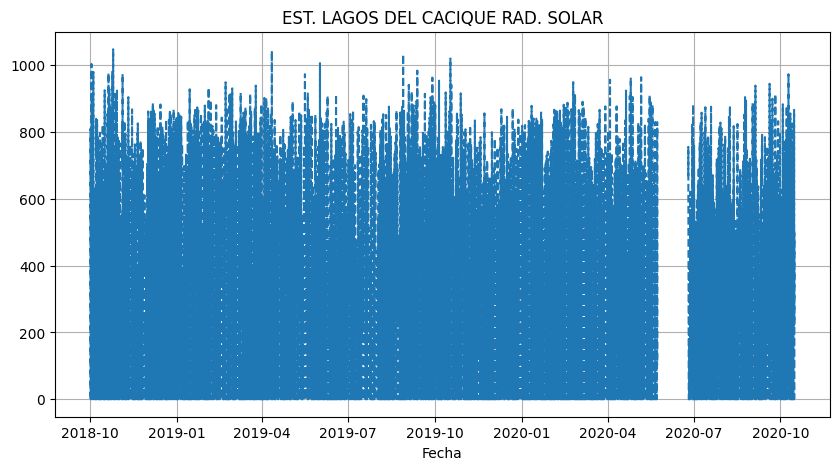

In [ ]:
for i in df_Temp.columns[1:]:
  plt.figure(figsize=(10, 5))
  plt.plot(df_Temp['Unnamed: 0'],
           df_Temp[i],
           ls='--')
  plt.grid()
  plt.title(i)
  plt.xlabel('Fecha')
  plt.show()
  print('\n')

La estación de Girón es la que cuenta con la mayor cantidad de datos, aproximadamente desde julio de 2019. Las demás estaciones presentan varios vacíos o ausencias de información, lo cual podría deberse a fallas en las estaciones o errores en el almacenamiento de datos. En la información disponible no se especifica la causa de estas ausencias.

## Columnas de interes

Se trabajará considerando únicamente la temperatura y la humedad, por lo que se extraerá el DataFrame correspondiente a las estaciones que registran estas variables.

In [ ]:
df.columns

Index(['Unnamed: 0', 'EST. LAGOS I F/BLANCA PM10 ',
       'EST. LAGOS I F/BLANCA PM2,5', 'EST. LAGOS I F/BLANCA NO2',
       'EST. LAGOS I F/BLANCA O3', 'EST. LACIUDADELA PM10 ',
       'EST. LACIUDADELA PM2,5', 'EST. LACIUDADELA NO2', 'EST. LACIUDADELA O3',
       'EST. SANTA CRUZ GIRÓN PM10 ', 'EST. SANTA CRUZ GIRÓN PM2,5',
       'EST. SAN FRANCISCO PM10 ', 'EST. SAN FRANCISCO PM2,5',
       ' EST. LAGOS DEL CACIQUE PM10 ', ' EST. LAGOS DEL CACIQUE PM2,5',
       'EST. LAGOS I F/BLANCA TEMPERATURA', 'EST. LAGOS I F/BLANCA LLUVIA',
       'EST. LAGOS I F/BLANCA HUMEDAD', 'EST. LAGOS I F/BLANCA DIR. VIENTO',
       'EST. LAGOS I F/BLANCA VEL.VIENTO', 'EST. LAGOS I F/BLANCA RAD. SOLAR',
       'EST. LACIUDADELA TEMPERATURA', 'EST. LACIUDADELA LLUVIA',
       'EST. LACIUDADELA HUMEDAD', 'EST. LACIUDADELA DIR. VIENTO',
       'EST. LACIUDADELA VEL.VIENTO', 'EST. LACIUDADELA RAD. SOLAR',
       'EST. SANTA CRUZ GIRÓN TEMPERATURA', 'EST. SANTA CRUZ GIRÓN LLUVIA',
       'EST. SANTA CRUZ G

In [ ]:
colInteres = ['Unnamed: 0'] # se deja la de la fecha de una vez

for i in df.columns:
  if 'TEMPERATURA' in i or 'HUMEDAD' in i:
    colInteres.append(i)

colInteres

['Unnamed: 0',
 'EST. LAGOS I F/BLANCA TEMPERATURA',
 'EST. LAGOS I F/BLANCA HUMEDAD',
 'EST. LACIUDADELA TEMPERATURA',
 'EST. LACIUDADELA HUMEDAD',
 'EST. SANTA CRUZ GIRÓN TEMPERATURA',
 'EST. SANTA CRUZ GIRÓN HUMEDAD',
 'EST. SAN FRANCISCO TEMPERATURA',
 'EST. SAN FRANCISCO HUMEDAD',
 'EST. LAGOS DEL CACIQUE TEMPERATURA',
 'EST. LAGOS DEL CACIQUE HUMEDAD']

# 3 Selección de datos

In [ ]:
df_TempHum = df[colInteres].copy()
df_TempHum['Unnamed: 0'] = pd.to_datetime(df_TempHum['Unnamed: 0'], dayfirst=True)
df_TempHum.head()

,Unnamed: 0,EST. LAGOS I F/BLANCA TEMPERATURA,EST. LAGOS I F/BLANCA HUMEDAD,EST. LACIUDADELA TEMPERATURA,EST. LACIUDADELA HUMEDAD,EST. SANTA CRUZ GIRÓN TEMPERATURA,EST. SANTA CRUZ GIRÓN HUMEDAD,EST. SAN FRANCISCO TEMPERATURA,EST. SAN FRANCISCO HUMEDAD,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE HUMEDAD
0,2018-10-01 00:00:00,NaN,NaN,NaN,NaN,23.6,86.4,22.9,80.2,22.2,83.5
1,2018-10-01 01:00:00,NaN,NaN,NaN,NaN,23.2,86.6,21.9,88.0,21.7,89.8
2,2018-10-01 02:00:00,NaN,NaN,NaN,NaN,22.9,87.4,22.1,87.0,21.7,86.8
3,2018-10-01 03:00:00,NaN,NaN,NaN,NaN,22.6,88.7,22.1,83.1,21.6,84.9
4,2018-10-01 04:00:00,NaN,NaN,NaN,NaN,22.3,87.8,21.2,90.8,20.7,91.7


In [ ]:
df_TempHum.tail()

,Unnamed: 0,EST. LAGOS I F/BLANCA TEMPERATURA,EST. LAGOS I F/BLANCA HUMEDAD,EST. LACIUDADELA TEMPERATURA,EST. LACIUDADELA HUMEDAD,EST. SANTA CRUZ GIRÓN TEMPERATURA,EST. SANTA CRUZ GIRÓN HUMEDAD,EST. SAN FRANCISCO TEMPERATURA,EST. SAN FRANCISCO HUMEDAD,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE HUMEDAD
17899,2020-10-15 19:00:00,NaN,NaN,23.6,76.2,26.8,64.7,23.9,76.2,24.1,75.0
17900,2020-10-15 20:00:00,NaN,NaN,23.6,76.8,25.9,68.0,23.7,77.7,23.7,77.3
17901,2020-10-15 21:00:00,NaN,NaN,23.1,79.7,24.9,72.9,23.5,77.6,23.4,78.3
17902,2020-10-15 22:00:00,NaN,NaN,22.9,79.2,24.1,76.7,23.4,77.6,23.0,78.8
17903,2020-10-15 23:00:00,NaN,NaN,22.2,80.9,23.4,80.1,23.2,77.4,22.6,78.7


In [ ]:
df_TempHum.iloc[:, 1:].describe().round(2)

,EST. LAGOS I F/BLANCA TEMPERATURA,EST. LAGOS I F/BLANCA HUMEDAD,EST. LACIUDADELA TEMPERATURA,EST. LACIUDADELA HUMEDAD,EST. SANTA CRUZ GIRÓN TEMPERATURA,EST. SANTA CRUZ GIRÓN HUMEDAD,EST. SAN FRANCISCO TEMPERATURA,EST. SAN FRANCISCO HUMEDAD,EST. LAGOS DEL CACIQUE TEMPERATURA,EST. LAGOS DEL CACIQUE HUMEDAD
count,13812.00,13812.00,17022.00,17052.00,17709.00,17711.00,16917.00,16920.00,16037.00,17060.00
mean,25.60,65.73,24.15,68.96,26.42,65.90,24.23,69.22,24.59,69.65
std,3.25,13.69,3.50,13.51,3.67,15.49,2.37,12.61,3.10,13.44
min,19.20,22.70,3.20,16.10,18.40,23.90,18.90,25.70,14.40,24.90
25%,22.90,54.60,21.60,58.50,23.20,51.60,22.30,59.80,22.10,59.40
50%,25.10,68.00,23.80,71.00,25.80,68.30,24.00,70.80,24.00,72.50
75%,28.30,76.60,26.60,79.80,29.60,79.80,26.00,79.40,26.90,80.40
max,34.70,95.10,36.10,95.10,36.60,95.40,31.90,96.00,34.80,96.70


## Temporalidad

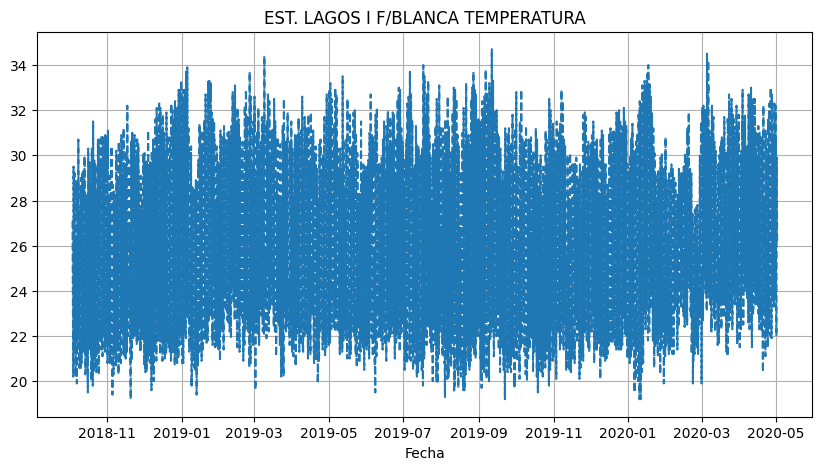

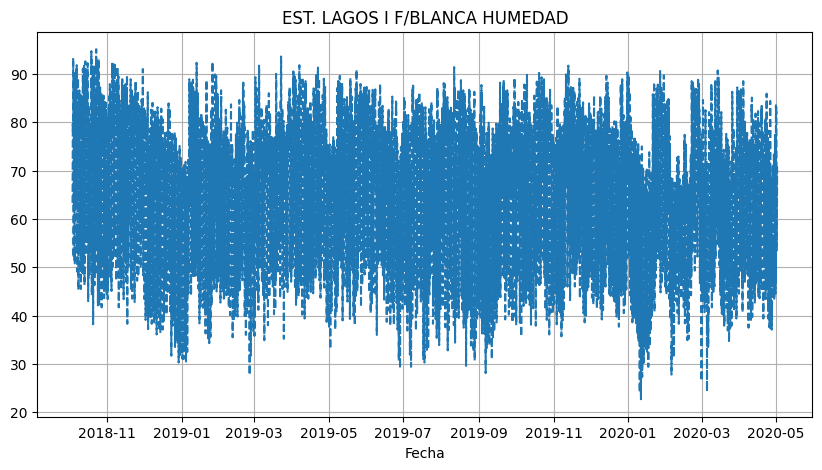

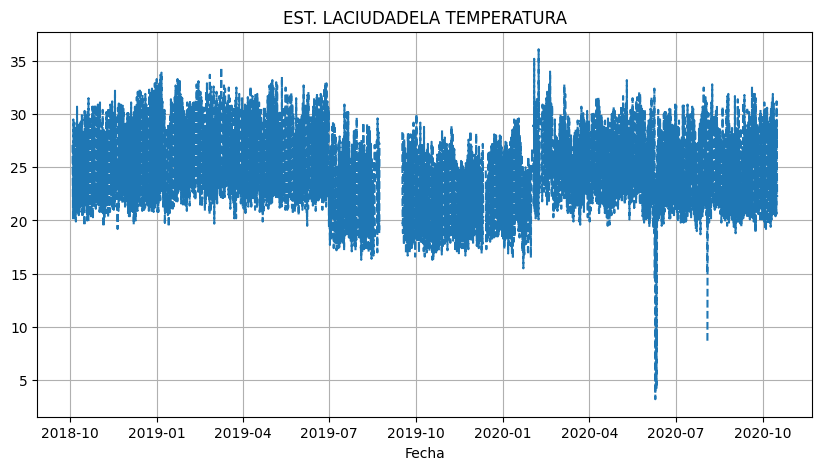

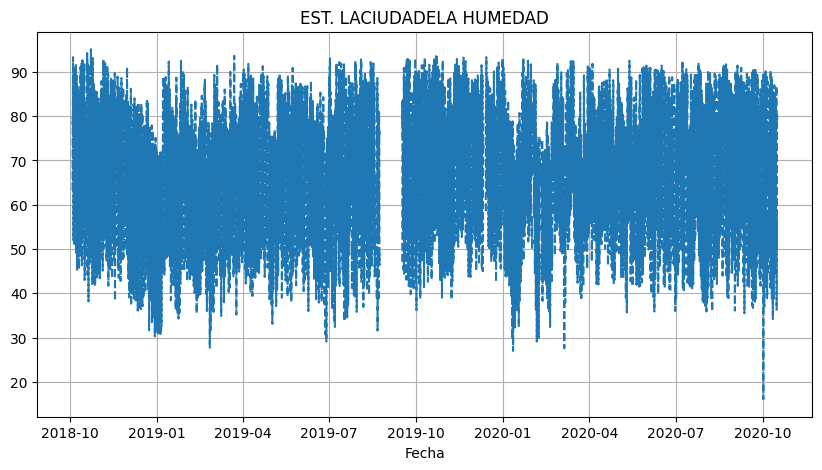

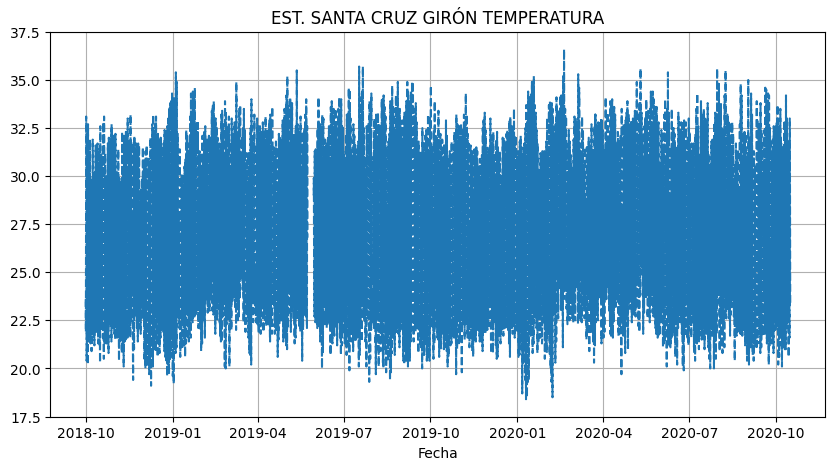

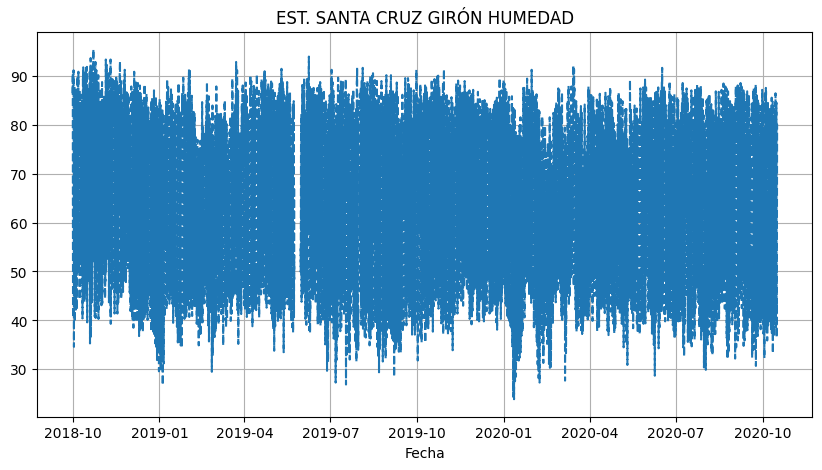

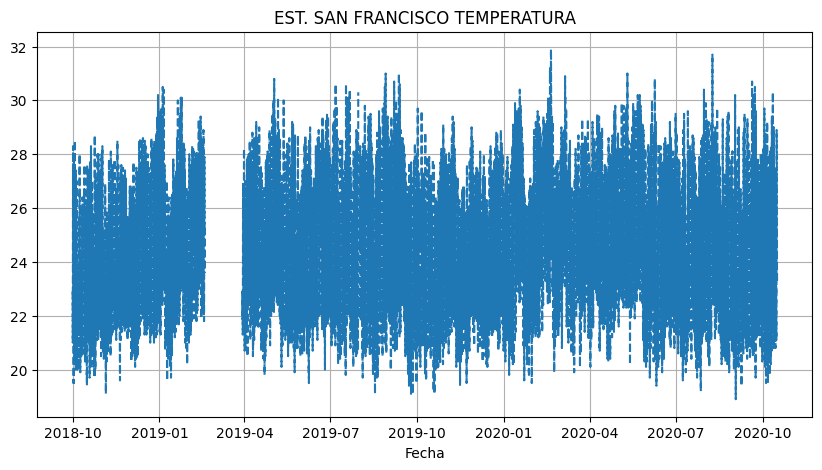

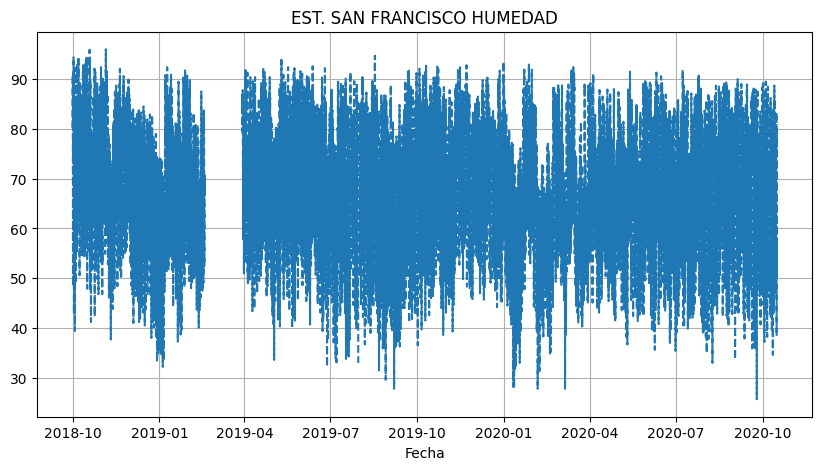

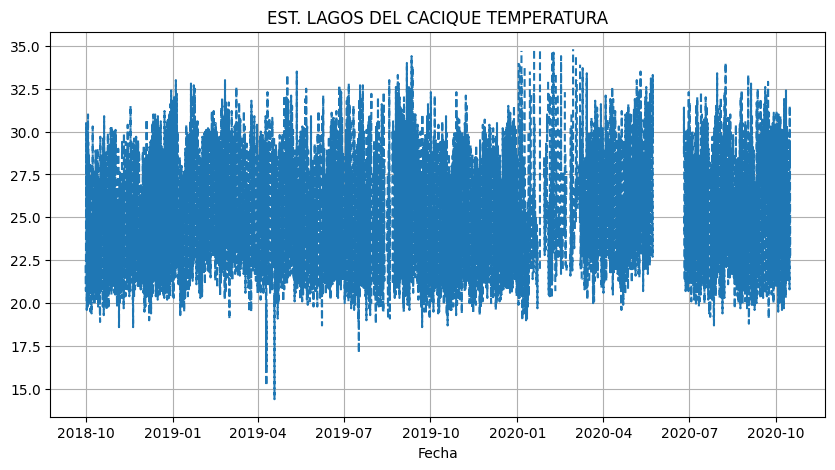

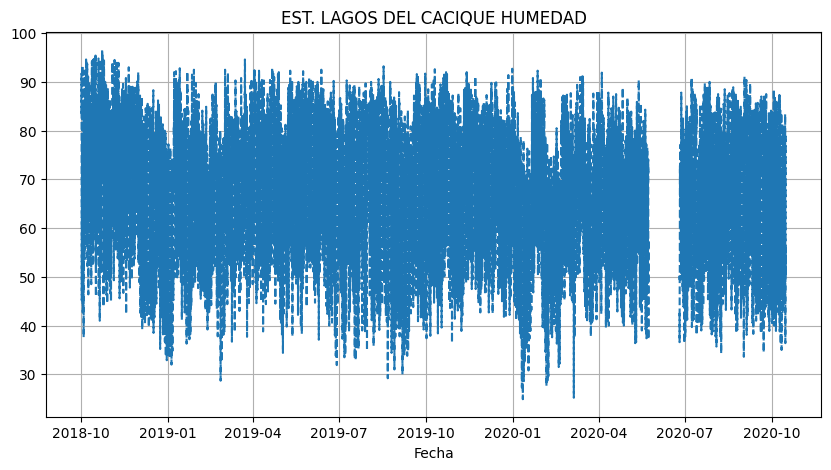

In [ ]:
for i in df_TempHum.columns[1:]:
  plt.figure(figsize=(10, 5))
  plt.plot(df_TempHum['Unnamed: 0'],
           df_TempHum[i],
           ls='--')
  plt.grid()
  plt.title(i)
  plt.xlabel('Fecha')
  plt.show()
  print('\n')

## Nulos

Se procederá a realizar un nuevo conteo de los valores nulos en las columnas de temperatura y humedad para verificar la ausencia de información.

In [ ]:
nulosTemHum = df_TempHum.isna().sum().sort_values(ascending=False)
nulosTemHum

,0
EST. LAGOS I F/BLANCA TEMPERATURA,4092
EST. LAGOS I F/BLANCA HUMEDAD,4092
EST. LAGOS DEL CACIQUE TEMPERATURA,1867
EST. SAN FRANCISCO TEMPERATURA,987
EST. SAN FRANCISCO HUMEDAD,984
EST. LACIUDADELA TEMPERATURA,882
EST. LACIUDADELA HUMEDAD,852
EST. LAGOS DEL CACIQUE HUMEDAD,844
EST. SANTA CRUZ GIRÓN TEMPERATURA,195
EST. SANTA CRUZ GIRÓN HUMEDAD,193


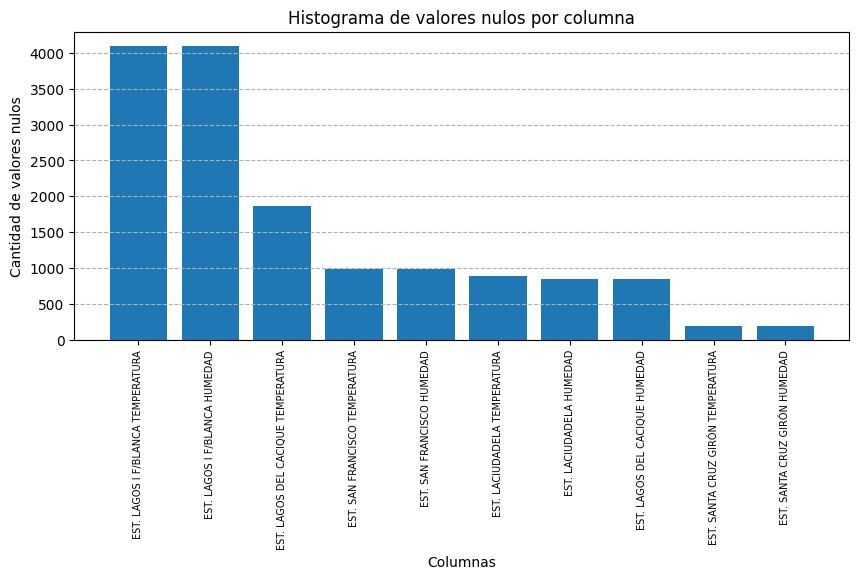

In [ ]:
plt.figure(figsize=(10, 4))
plt.bar(nulosTemHum.index[:-1], nulosTemHum.values[:-1])
plt.xlabel('Columnas')
# Inclinación de las etiquetas del eje X
plt.xticks(rotation=90, fontsize=7)
plt.ylabel('Cantidad de valores nulos')
plt.title('Histograma de valores nulos por columna')
plt.grid(ls='--', axis='y')
plt.show()

## Histograma Temperatura

In [ ]:
df_TempHum.columns

Index(['Unnamed: 0', 'EST. LAGOS I F/BLANCA TEMPERATURA',
       'EST. LAGOS I F/BLANCA HUMEDAD', 'EST. LACIUDADELA TEMPERATURA',
       'EST. LACIUDADELA HUMEDAD', 'EST. SANTA CRUZ GIRÓN TEMPERATURA',
       'EST. SANTA CRUZ GIRÓN HUMEDAD', 'EST. SAN FRANCISCO TEMPERATURA',
       'EST. SAN FRANCISCO HUMEDAD', 'EST. LAGOS DEL CACIQUE TEMPERATURA',
       'EST. LAGOS DEL CACIQUE HUMEDAD'],
      dtype='object')

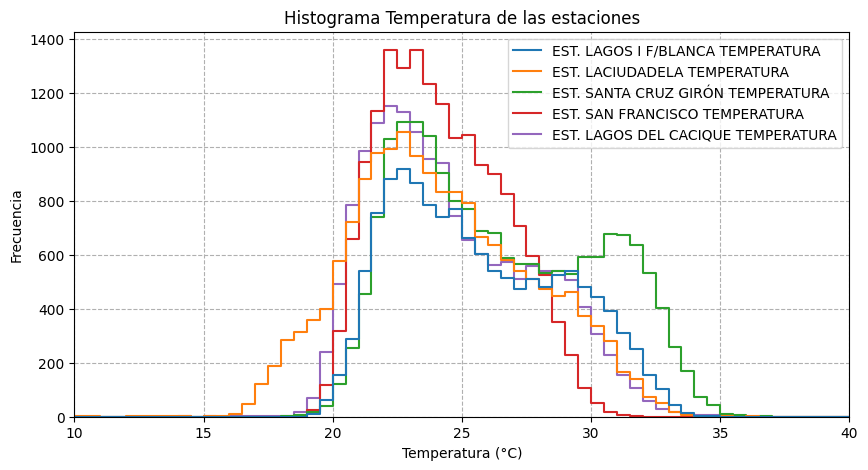

In [ ]:
bins_temp = np.arange(10, 41, 0.5)

plt.figure(figsize=(10, 5))

sns.histplot(data=df_TempHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
                              'EST. LACIUDADELA TEMPERATURA',
                              'EST. SANTA CRUZ GIRÓN TEMPERATURA',
                              'EST. SAN FRANCISCO TEMPERATURA',
                              'EST. LAGOS DEL CACIQUE TEMPERATURA']],
             #kde=True,
             fill=False,
             element="step",
             bins=bins_temp)

plt.xlabel('Temperatura (°C)')
plt.ylabel('Frecuencia')
plt.title('Histograma Temperatura de las estaciones')
plt.xlim(10, 40)

plt.grid(ls='--')

plt.show()

## 5-1 Calculo de Moda

Todas las estaciones presentan una tendencia similar, con una posible moda o mayor concentración de datos alrededor de los 23°C. Sin embargo, se observa que la estación de Girón, representada con la línea de color verde, muestra otra posible moda en valores cercanos a los 32°C.

In [ ]:
df_TempHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
            'EST. LACIUDADELA TEMPERATURA',
            'EST. SANTA CRUZ GIRÓN TEMPERATURA',
            'EST. SAN FRANCISCO TEMPERATURA',
            'EST. LAGOS DEL CACIQUE TEMPERATURA']].mode()

,EST. LAGOS I F/BLANCA TEMPERATURA,EST. LACIUDADELA TEMPERATURA,EST. SANTA CRUZ GIRÓN TEMPERATURA,EST. SAN FRANCISCO TEMPERATURA,EST. LAGOS DEL CACIQUE TEMPERATURA
0,22.9,22.2,23.2,23.4,22.0


## Pie plot

In [ ]:
nulosTemHum

,0
EST. LAGOS I F/BLANCA TEMPERATURA,4092
EST. LAGOS I F/BLANCA HUMEDAD,4092
EST. LAGOS DEL CACIQUE TEMPERATURA,1867
EST. SAN FRANCISCO TEMPERATURA,987
EST. SAN FRANCISCO HUMEDAD,984
EST. LACIUDADELA TEMPERATURA,882
EST. LACIUDADELA HUMEDAD,852
EST. LAGOS DEL CACIQUE HUMEDAD,844
EST. SANTA CRUZ GIRÓN TEMPERATURA,195
EST. SANTA CRUZ GIRÓN HUMEDAD,193


In [ ]:
nulosTemHum.sum()

14988

In [ ]:
nulosTemHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SANTA CRUZ GIRÓN TEMPERATURA']].sum()

8023

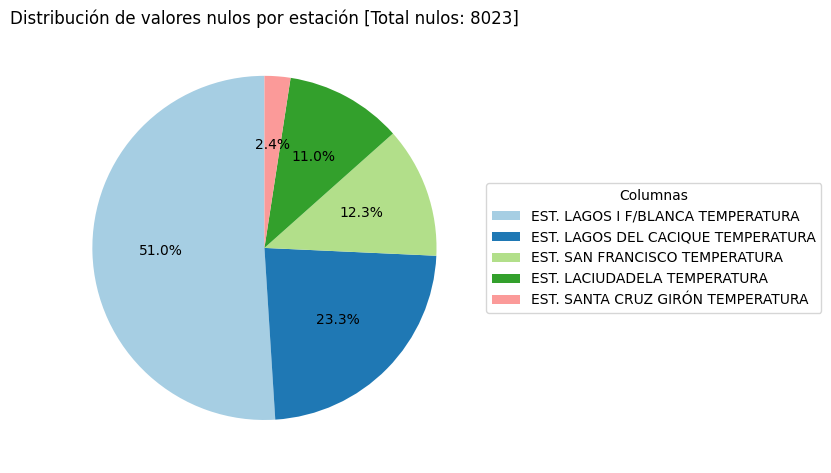

In [ ]:
sumNulosTemp = nulosTemHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SANTA CRUZ GIRÓN TEMPERATURA']].sum()

# Crear el gráfico de torta sin etiquetas en el gráfico
plt.figure(figsize=(8, 8))
plt.pie(nulosTemHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SANTA CRUZ GIRÓN TEMPERATURA']].values,
        labels=[""] * len(nulosTemHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SANTA CRUZ GIRÓN TEMPERATURA']].index),  # Oculta las etiquetas
        autopct='%1.1f%%',
        startangle=90,
        colors=plt.cm.Paired.colors)

# Agregar la leyenda con las etiquetas
plt.legend(nulosTemHum[['EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SANTA CRUZ GIRÓN TEMPERATURA']].index,
            title="Columnas", loc="center left", bbox_to_anchor=(1, 0.5))

plt.title(f'Distribución de valores nulos por estación [Total nulos: {sumNulosTemp}]')
plt.tight_layout()  # Ajusta el diseño para que la leyenda no se superponga
plt.show()


## Histogramas 2D

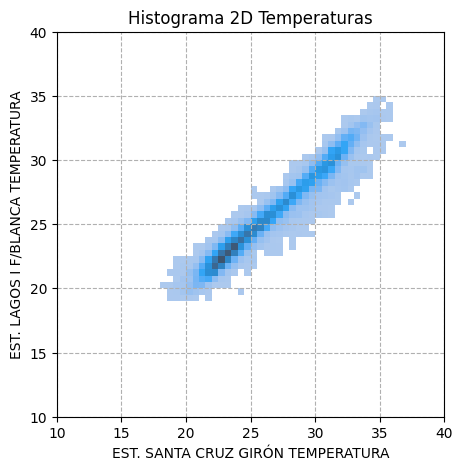

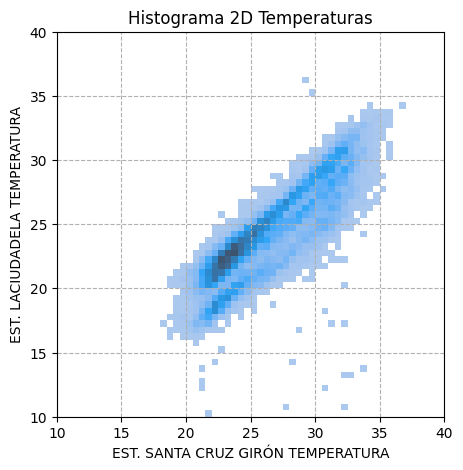

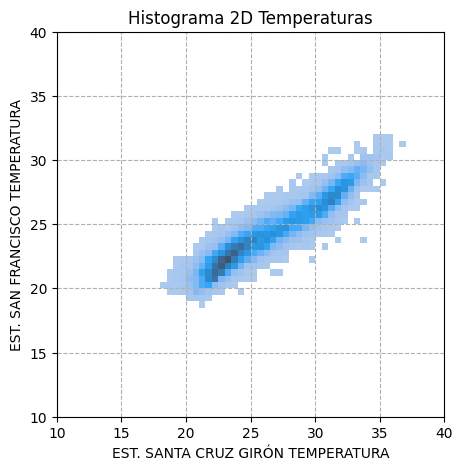

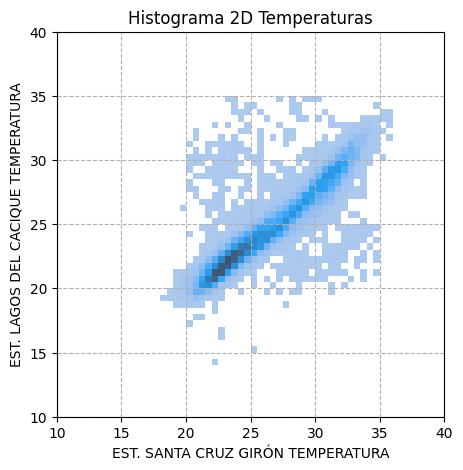

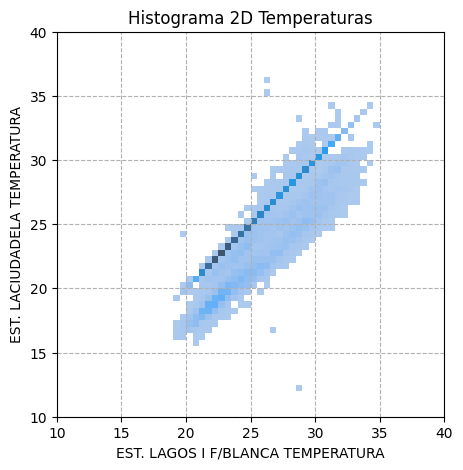

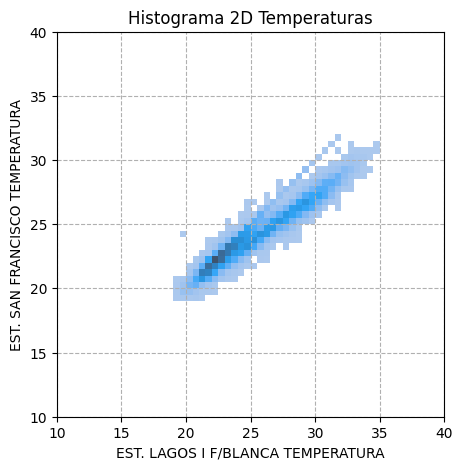

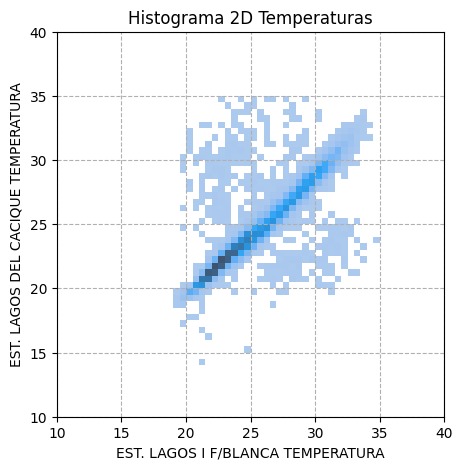

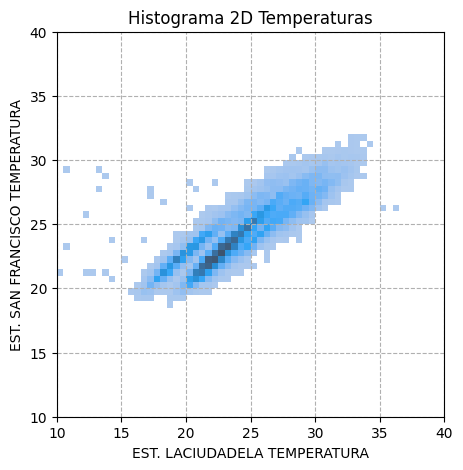

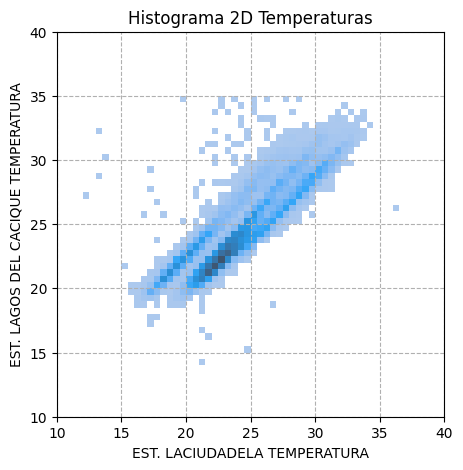

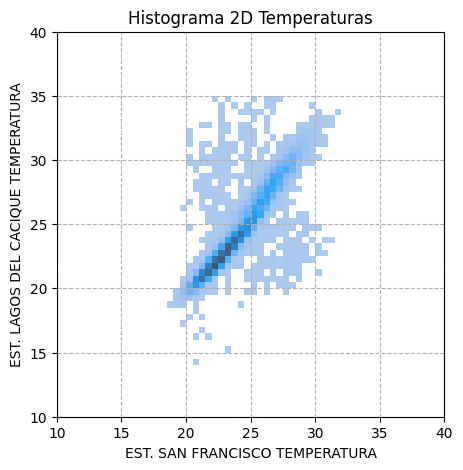

In [ ]:
bins_temp = [np.arange(10, 41, 0.5), np.arange(10, 41, 0.5)]

cols_Temp = ['EST. SANTA CRUZ GIRÓN TEMPERATURA',
             'EST. LAGOS I F/BLANCA TEMPERATURA',
             'EST. LACIUDADELA TEMPERATURA',
             'EST. SAN FRANCISCO TEMPERATURA',
             'EST. LAGOS DEL CACIQUE TEMPERATURA']

for col in range(len(cols_Temp)):
  for col2 in range(col+1, len(cols_Temp)):
    if col != col2:
      plt.figure(figsize=(5, 5))

      sns.histplot(data=df_TempHum,
                   x = cols_Temp[col],
                   y = cols_Temp[col2],
                  bins=bins_temp)

      plt.xlabel(cols_Temp[col])
      plt.ylabel(cols_Temp[col2])
      plt.title('Histograma 2D Temperaturas')
      plt.xlim(10, 40)
      plt.ylim(10, 40)

      plt.grid(ls='--')

      plt.show()
      print('\n')

## Temporalidad Temperatura

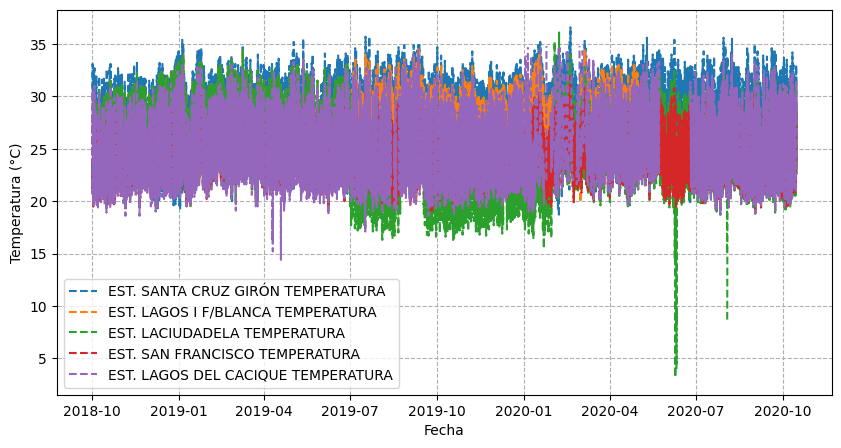

In [ ]:
# Grafica de la temporalidad de todas las estaciones
plt.figure(figsize=(10, 5))
for i in cols_Temp:
  plt.plot(df_TempHum['Unnamed: 0'],
           df_TempHum[i],
           label=i,
           ls='--',
           alpha=1)

plt.grid(ls='--')
plt.xlabel('Fecha')
plt.ylabel('Temperatura (°C)')
plt.legend(loc='lower left')
plt.show()


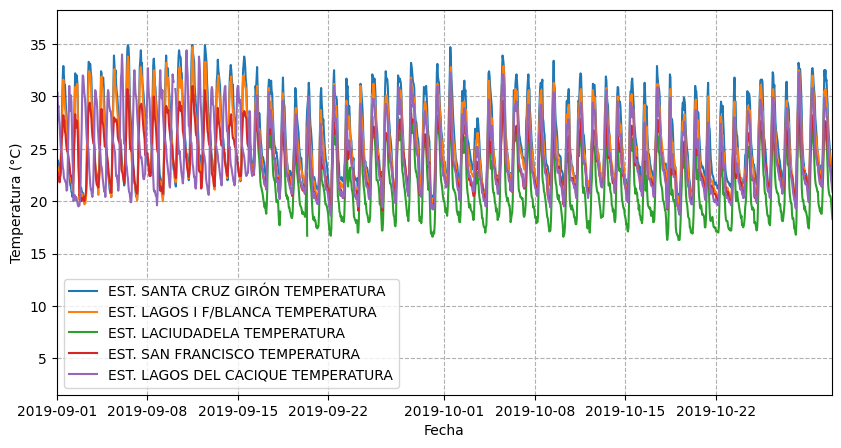

In [ ]:
# Definir límites de fechas correctamente usando numpy.datetime64
xlim_min = np.datetime64('2019-09-01')
xlim_max = np.datetime64('2019-10-31')
# Zoom a una ventana de tiempo

plt.figure(figsize=(10, 5))
for i in cols_Temp:
  plt.plot(df_TempHum['Unnamed: 0'],
           df_TempHum[i],
           label=i,
           ls='-',
           alpha=1)

plt.grid(ls='--')
plt.xlabel('Fecha')
plt.ylabel('Temperatura (°C)')
plt.legend(loc='lower left')
plt.xlim(xlim_min, xlim_max)

plt.show()

# Filtrar por fecha

In [ ]:
# Obtener los índices con NaN en la columna de interes
indices_nan_columna = df_TempHum[df_TempHum['EST. SANTA CRUZ GIRÓN TEMPERATURA'].isna()].index

indices_nan_columna.shape

(195,)

In [ ]:
df_TempHum['Unnamed: 0'].loc[indices_nan_columna]

,Unnamed: 0
5635,2019-05-23 19:00:00
5636,2019-05-23 20:00:00
5637,2019-05-23 21:00:00
5638,2019-05-23 22:00:00
5639,2019-05-23 23:00:00
...,...
7293,2019-07-31 21:00:00
7294,2019-07-31 22:00:00
7295,2019-07-31 23:00:00
12009,2020-02-13 09:00:00


Parece que faltan datos hasta agosto, por lo que se filtrarán a partir de esa fecha.

In [ ]:
df_TempHum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17904 entries, 0 to 17903
Data columns (total 11 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Unnamed: 0                          17904 non-null  datetime64[ns]
 1   EST. LAGOS I F/BLANCA TEMPERATURA   13812 non-null  float64       
 2   EST. LAGOS I F/BLANCA HUMEDAD       13812 non-null  float64       
 3   EST. LACIUDADELA TEMPERATURA        17022 non-null  float64       
 4   EST. LACIUDADELA HUMEDAD            17052 non-null  float64       
 5   EST. SANTA CRUZ GIRÓN TEMPERATURA   17709 non-null  float64       
 6   EST. SANTA CRUZ GIRÓN HUMEDAD       17711 non-null  float64       
 7   EST. SAN FRANCISCO TEMPERATURA      16917 non-null  float64       
 8   EST. SAN FRANCISCO HUMEDAD          16920 non-null  float64       
 9   EST. LAGOS DEL CACIQUE TEMPERATURA  16037 non-null  float64       
 10  EST. LAGOS DEL CACIQUE

In [ ]:
# Supongamos que la columna de fecha se llama 'Fecha'
inicio = '2019-08-01'


filtro = df_TempHum['Unnamed: 0'] >= inicio
df_filtrado = df_TempHum.loc[filtro].copy()

df_filtrado.isna().sum().sort_values(ascending=False)

,0
EST. LAGOS I F/BLANCA TEMPERATURA,4026
EST. LAGOS I F/BLANCA HUMEDAD,4026
EST. LAGOS DEL CACIQUE TEMPERATURA,1832
EST. LACIUDADELA TEMPERATURA,816
EST. LAGOS DEL CACIQUE HUMEDAD,809
EST. LACIUDADELA HUMEDAD,786
EST. SAN FRANCISCO TEMPERATURA,7
EST. SAN FRANCISCO HUMEDAD,4
EST. SANTA CRUZ GIRÓN TEMPERATURA,2
Unnamed: 0,0


## Fillna Temperatura Girón

Faltan solo 2 datos en la temperatura para Girón, por lo que se completarán utilizando el valor de la celda anterior.

In [ ]:
df_filtrado['EST. SANTA CRUZ GIRÓN TEMPERATURA'].fillna(method='ffill', inplace=True)

df_filtrado.isna().sum().sort_values(ascending=False)

<ipython-input-34-12e46dd36f40>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_filtrado['EST. SANTA CRUZ GIRÓN TEMPERATURA'].fillna(method='ffill', inplace=True)
<ipython-input-34-12e46dd36f40>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_filtrado['EST. SANTA CRUZ GIRÓN TEMPERATURA'].fillna(method='ffill', inplace=True)


,0
EST. LAGOS I F/BLANCA TEMPERATURA,4026
EST. LAGOS I F/BLANCA HUMEDAD,4026
EST. LAGOS DEL CACIQUE TEMPERATURA,1832
EST. LACIUDADELA TEMPERATURA,816
EST. LAGOS DEL CACIQUE HUMEDAD,809
EST. LACIUDADELA HUMEDAD,786
EST. SAN FRANCISCO TEMPERATURA,7
EST. SAN FRANCISCO HUMEDAD,4
Unnamed: 0,0
EST. SANTA CRUZ GIRÓN TEMPERATURA,0


## Scatter plots

In [ ]:
df_filtrado.columns

Index(['Unnamed: 0', 'EST. LAGOS I F/BLANCA TEMPERATURA',
       'EST. LAGOS I F/BLANCA HUMEDAD', 'EST. LACIUDADELA TEMPERATURA',
       'EST. LACIUDADELA HUMEDAD', 'EST. SANTA CRUZ GIRÓN TEMPERATURA',
       'EST. SANTA CRUZ GIRÓN HUMEDAD', 'EST. SAN FRANCISCO TEMPERATURA',
       'EST. SAN FRANCISCO HUMEDAD', 'EST. LAGOS DEL CACIQUE TEMPERATURA',
       'EST. LAGOS DEL CACIQUE HUMEDAD'],
      dtype='object')

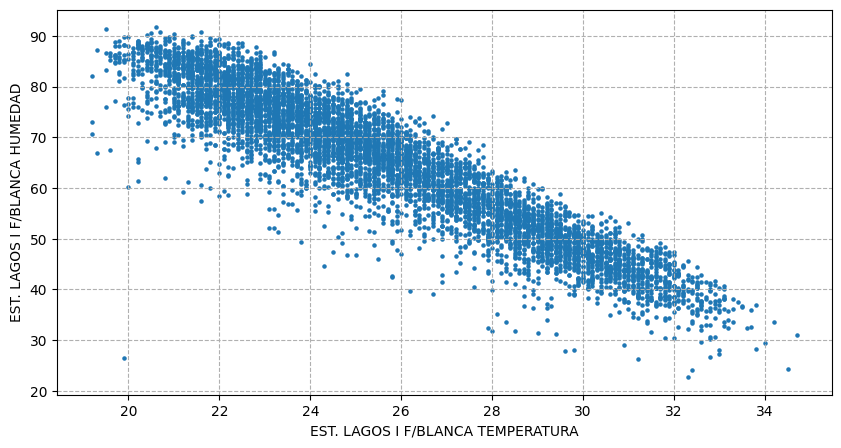

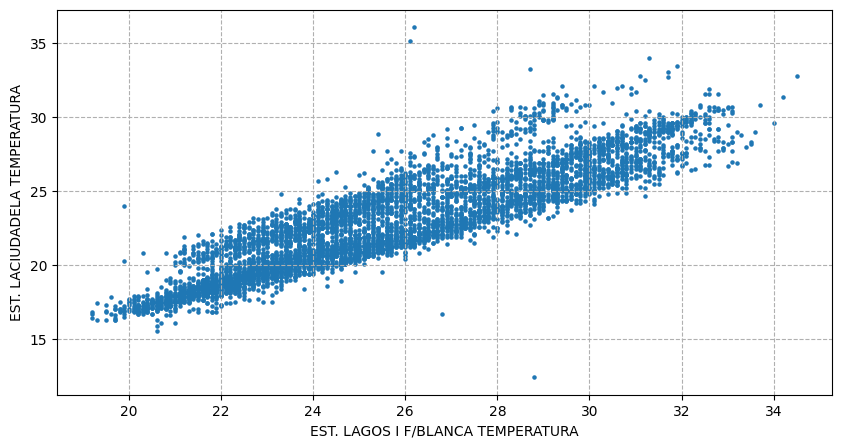

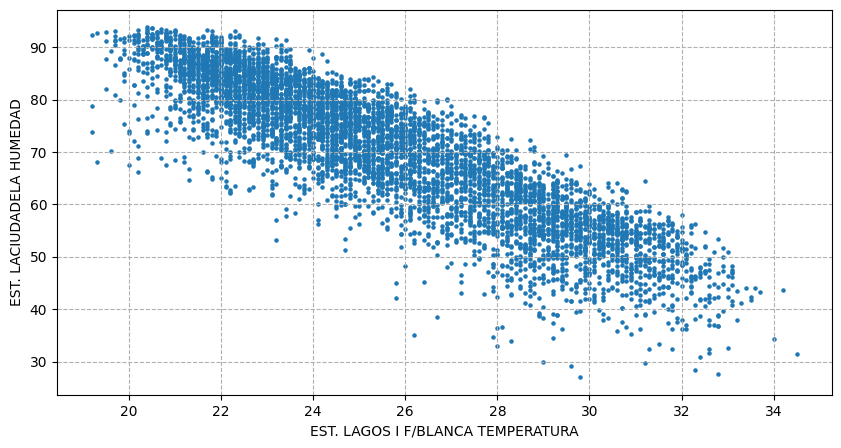

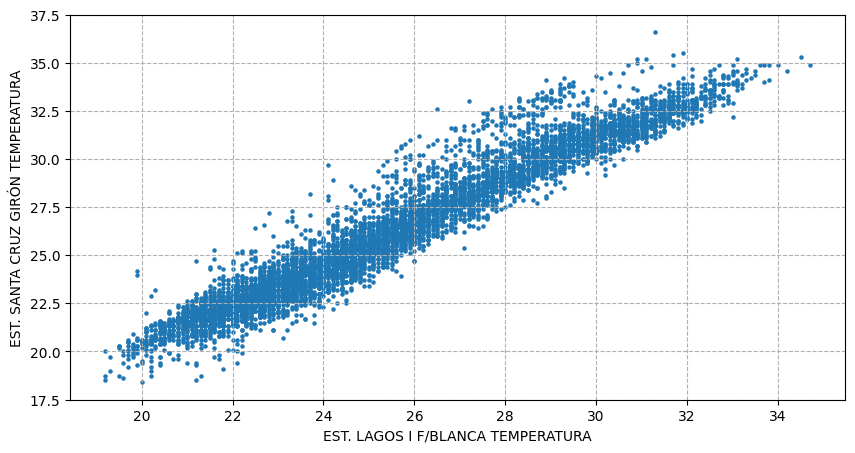

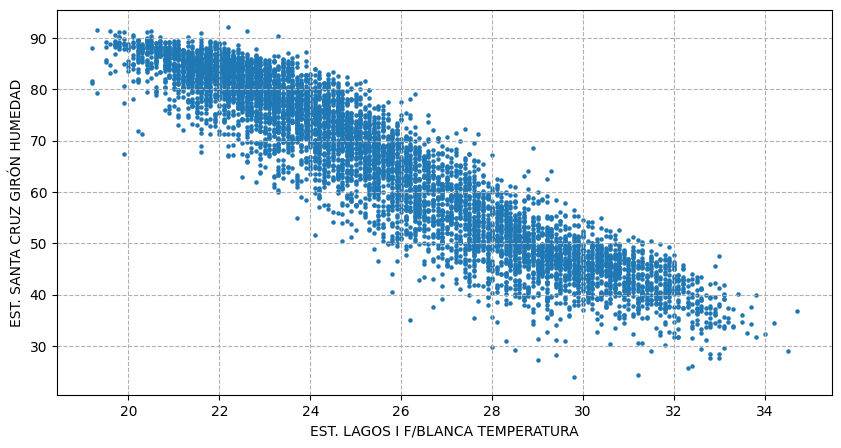

...

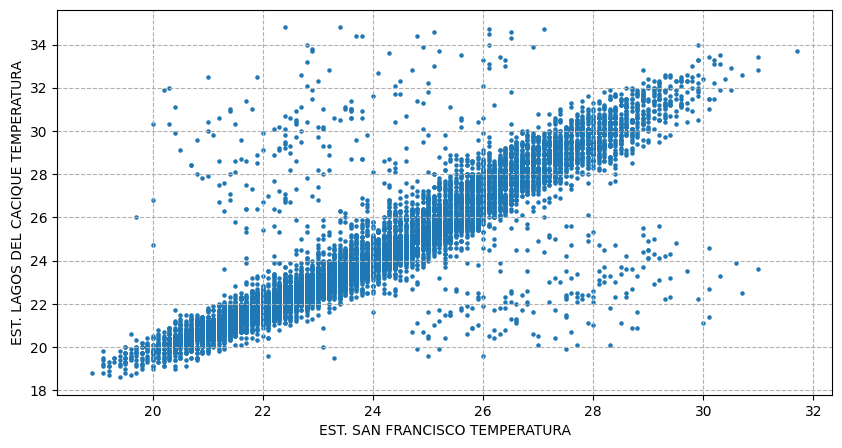

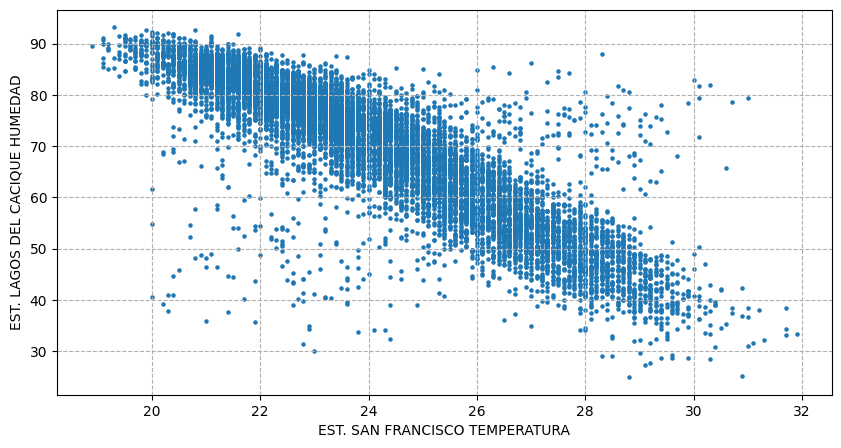

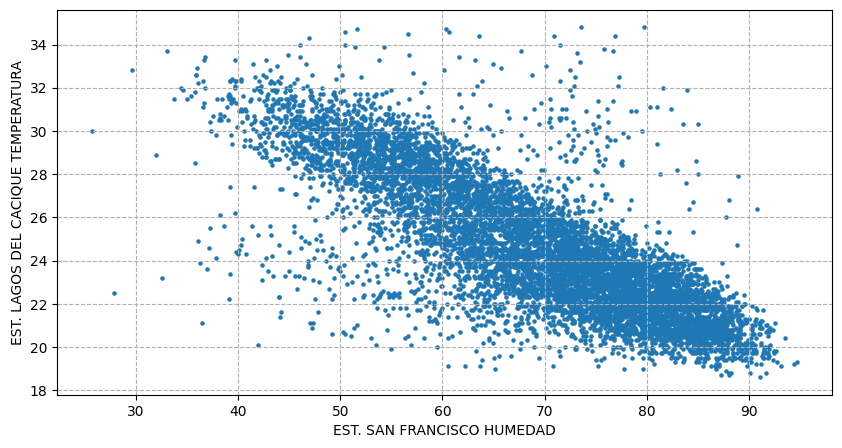

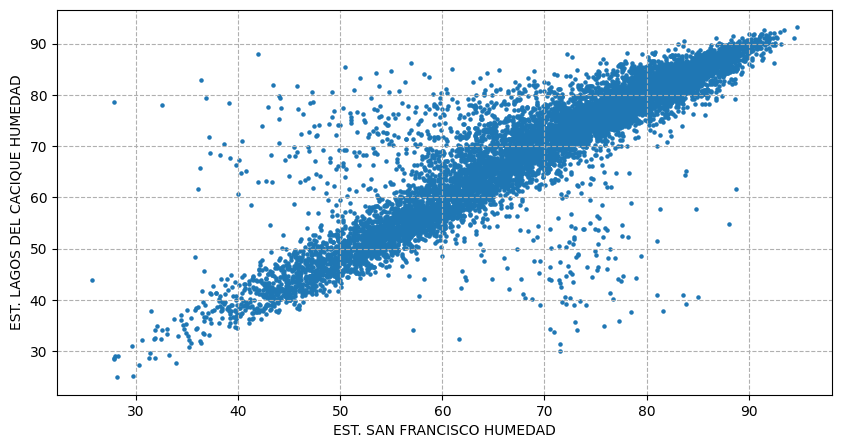

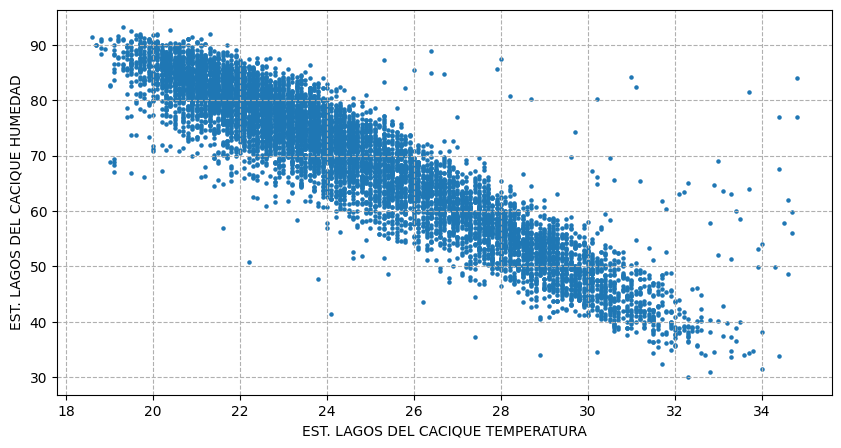

In [ ]:
for i in range(len(df_filtrado.columns[1:])):
  for j in range(i+1, len(df_filtrado.columns[1:])):
    plt.figure(figsize=(10, 5))
    plt.scatter(df_filtrado[df_filtrado.columns[i+1]],
                df_filtrado[df_filtrado.columns[j+1]],
                s=5)
    plt.xlabel(df_filtrado.columns[i+1])
    plt.ylabel(df_filtrado.columns[j+1])
    plt.grid(ls='--')
    plt.show()
    print('\n')

Los gráficos de puntos muestran evidencia de una correlación moderadamente lineal entre las variables.

## Boxplots

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 17.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 14.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


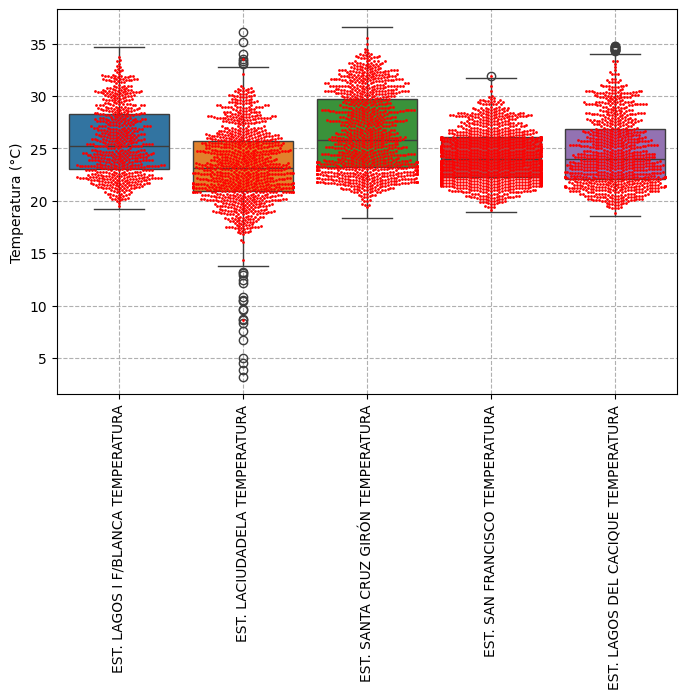

In [ ]:
# Identificar columnas relacionadas con la temperatura
colTemp = [i for i in df_filtrado.columns if 'TEMPERATURA' in i]

# Crear el gráfico de caja
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_filtrado[colTemp])
sns.swarmplot(data=df_filtrado[colTemp][::10], color= 'red', size=2)

plt.xticks(rotation=90)
plt.grid(ls='--')
plt.ylabel('Temperatura (°C)')
plt.show()

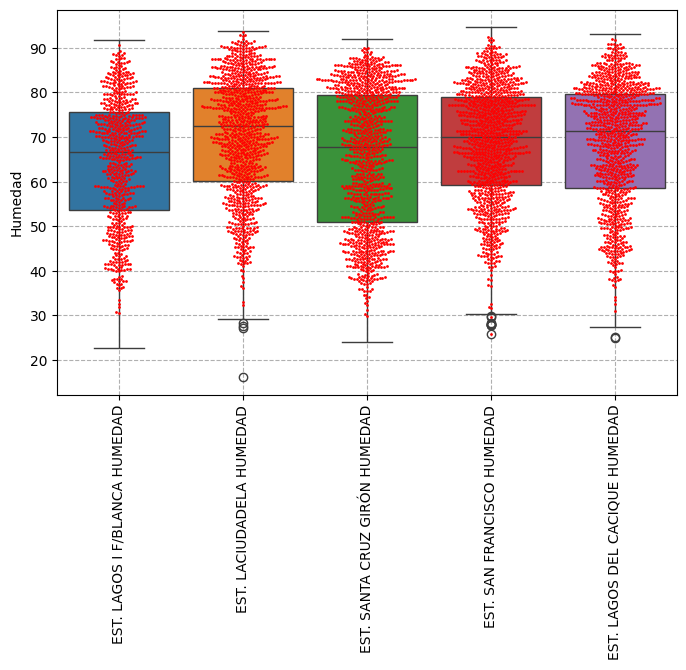

In [ ]:
# Identificar columnas relacionadas con la temperatura
colHum = [i for i in df_filtrado.columns if 'HUMEDAD' in i]

# Crear el gráfico de caja
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_filtrado[colHum])
sns.swarmplot(data=df_filtrado[colHum][::10], color= 'red', size=2)

plt.xticks(rotation=90)
plt.grid(ls='--')
plt.ylabel('Humedad')
plt.show()

# 8 Crear Train Data

Se utilizará la información de la estación de Girón para predecir los valores de la estación de Floridablanca. Para ello, se tomará la temperatura de los 7 días anteriores como base para predecir la temperatura en Floridablanca.

In [ ]:
df_Temporal = df_filtrado[['Unnamed: 0', 'EST. SANTA CRUZ GIRÓN TEMPERATURA', 'EST. LAGOS I F/BLANCA TEMPERATURA']].copy()
df_Temporal.isna().sum().sort_values(ascending=False)

,0
EST. LAGOS I F/BLANCA TEMPERATURA,4026
Unnamed: 0,0
EST. SANTA CRUZ GIRÓN TEMPERATURA,0


In [ ]:
# Se va colocar con 0 los NaN para luego filtrar el y
df_Temporal.fillna(0, inplace=True)
df_Temporal.isna().sum().sort_values(ascending=False)

,0
Unnamed: 0,0
EST. SANTA CRUZ GIRÓN TEMPERATURA,0
EST. LAGOS I F/BLANCA TEMPERATURA,0


In [ ]:
temp_Giron = df_Temporal['EST. SANTA CRUZ GIRÓN TEMPERATURA'].values.reshape(-1, 1)
temp_FloBlanca = df_Temporal['EST. LAGOS I F/BLANCA TEMPERATURA'].values.reshape(-1, 1)
fecha = df_Temporal['Unnamed: 0'].values.reshape(-1, 1)

In [ ]:
X = []
y = []
date = []

for i in range(7, len(temp_Giron)):
  X.append(temp_Giron[i-7:i])
  y.append(temp_FloBlanca[i])
  date.append(fecha[i])

X = np.array(X)
y = np.array(y)
date = np.array(date)

In [ ]:
print('Shape de X: ', X.shape)
print('Shape de y: ', y.shape)
print('Shape de date: ', date.shape)

Shape de X:  (10601, 7, 1)
Shape de y:  (10601, 1)
Shape de date:  (10601, 1)


In [ ]:
X = X.reshape(X.shape[0], X.shape[1])

In [ ]:
print('Shape de X: ', X.shape)
print('Shape de y: ', y.shape)
print('Shape de date: ', date.shape)

Shape de X:  (10601, 7)
Shape de y:  (10601, 1)
Shape de date:  (10601, 1)


In [ ]:
np.sum(y == 0)

4026

In [ ]:
X.shape[0] - np.sum(y == 0)

6575

In [ ]:
filtro = y != 0
filtro = filtro.reshape(-1)

X2 = X[filtro].copy()
y2 = y[filtro].copy()


print('Shape de X: ', X2.shape)
print('Shape de y: ', y2.shape)

Shape de X:  (6575, 7)
Shape de y:  (6575, 1)


Se tomaron 6575 valores de Girón (X) y Floridablanca (y) para entrenar y lograr predecir 4025 datos faltantes de Floridablanca.

# Train-Test split

In [ ]:
# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

In [ ]:
# Crear el modelo de regresión lineal
regressor = LinearRegression()

In [ ]:
# Entrenar el modelo usando el conjunto de entrenamiento
regressor.fit(X_train, y_train)

LinearRegression()

## Coeficientes

In [ ]:
coef = np.round(regressor.coef_, 3)[0]
coef # los pesos de cada varible de entrada

array([-0.003, -0.022,  0.024, -0.088,  0.013, -0.472,  1.279])

## Intercepto

In [ ]:
intercep = np.round(regressor.intercept_, 3)[0]
intercep # el corte o intercepto en el eje Y

6.294

## Predecir

In [ ]:
# Realizar predicciones en el conjunto de prueba
y_pred = regressor.predict(X_test)

## Score

In [ ]:
# Puntaje
scoreReg_Train = np.round(regressor.score(X_train,
                                 y_train.reshape((-1,1))) , 3)

scoreReg_Test = np.round(regressor.score(X_test,
                                y_test.reshape((-1,1))) , 3)

print(f'Puntaje Train: {scoreReg_Train}')
print(f'Puntaje Test: {scoreReg_Test}')

Puntaje Train: 0.893
Puntaje Test: 0.884


In [ ]:
# Evaluar el modelo
mse = np.round(mean_squared_error(y_test, y_pred), 3)
rmse = np.round(np.sqrt(mse), 3)
r2 = np.round(r2_score(y_test, y_pred), 3)

# Imprimir los resultados
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'R2 Score: {r2}')

Mean Squared Error: 1.186
Root Mean Squared Error: 1.089
R2 Score: 0.884


El modelo es aceptable para efectos del ejercicio de predicción de las temperaturas faltantes de Floridablanca.

# DF Predicho

In [ ]:
dictPred = {'Fecha': date.flatten(),
            'Temp.': y.flatten(),
            'Temp. Pred.': regressor.predict(X).flatten()}

In [ ]:
dictPred['Temp. Pred.'].flatten()

array([22.99978912, 24.17354412, 27.81642962, ..., 24.58154928,
       23.80021832, 23.30351006])

In [ ]:
df_Pred = pd.DataFrame(dictPred)
df_Pred['Fecha'] = pd.to_datetime(df_Pred['Fecha'])
df_Pred.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10601 entries, 0 to 10600
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Fecha        10601 non-null  datetime64[ns]
 1   Temp.        10601 non-null  float64       
 2   Temp. Pred.  10601 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 248.6 KB


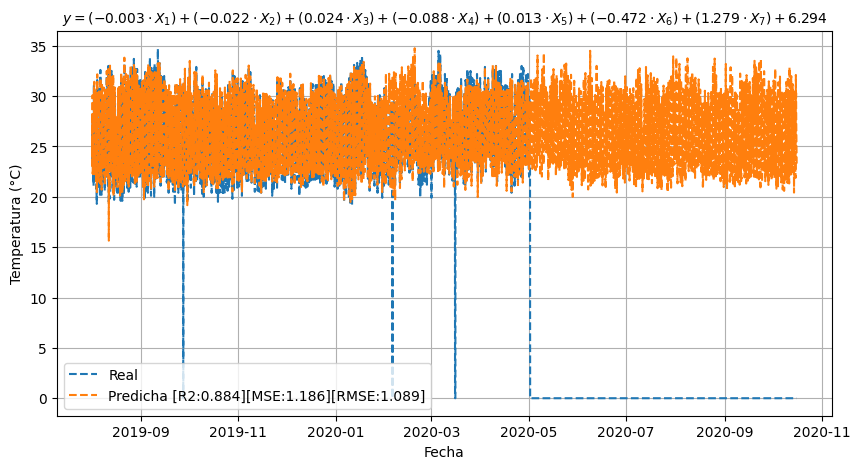

In [ ]:
formula = f'$y=({coef[0]}\cdot X_1)+({coef[1]}\cdot X_2)+({coef[2]}\cdot X_3)+({coef[3]}\cdot X_4)+({coef[4]}\cdot X_5)+({coef[5]}\cdot X_6)+({coef[6]}\cdot X_7) + {intercep}$'

plt.figure(figsize=(10, 5))
plt.plot(df_Pred['Fecha'],
          df_Pred['Temp.'],
          ls='--',
         label='Real')

plt.plot(df_Pred['Fecha'],
          df_Pred['Temp. Pred.'],
          ls='--',
         label=f'Predicha [R2:{r2}][MSE:{mse}][RMSE:{rmse}]')


plt.grid()
plt.title(formula, fontsize=10)
plt.ylabel('Temperatura (°C)')
plt.xlabel('Fecha')
plt.legend(loc='lower left', fontsize=10)
plt.show()


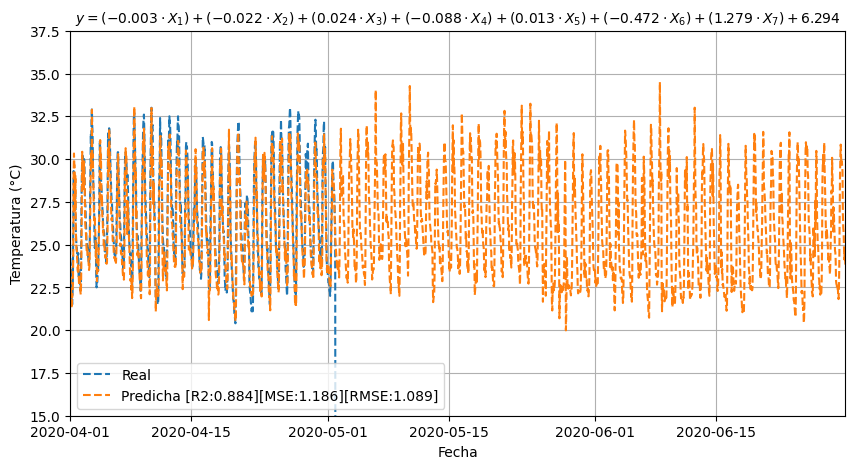

In [ ]:
# Definir límites de fechas correctamente usando numpy.datetime64
xlim_min = np.datetime64('2020-04-01')
xlim_max = np.datetime64('2020-06-30')

plt.figure(figsize=(10, 5))
plt.plot(df_Pred['Fecha'],
          df_Pred['Temp.'],
          ls='--',
         label='Real')

plt.plot(df_Pred['Fecha'],
          df_Pred['Temp. Pred.'],
          ls='--',
         label=f'Predicha [R2:{r2}][MSE:{mse}][RMSE:{rmse}]')


plt.grid()
plt.title(formula, fontsize=10)
plt.ylabel('Temperatura (°C)')
plt.xlabel('Fecha')
plt.legend(loc='lower left', fontsize=10)

plt.xlim(xlim_min, xlim_max)
plt.ylim(15, 37.5)

plt.show()

En esta gráfica se evidencia en azul la información faltante de Floridablanca y en naranja los valores predichos con base al modelo de regresión lineal del entrenamiento.

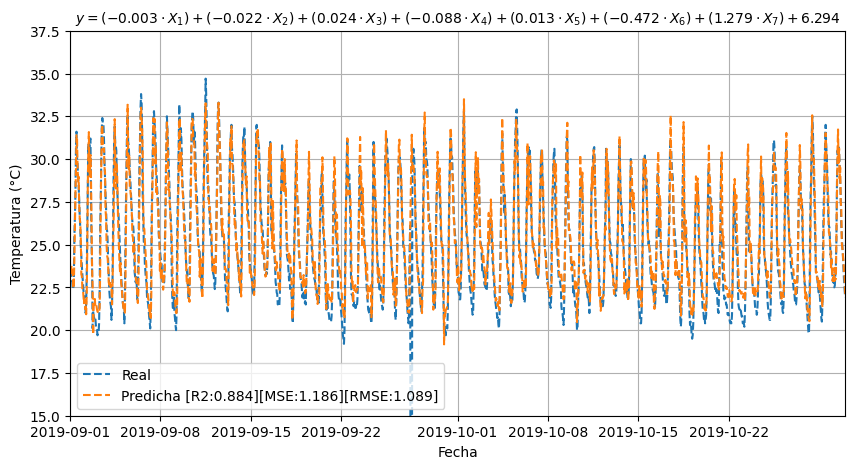

In [ ]:
# Definir límites de fechas correctamente usando numpy.datetime64
xlim_min = np.datetime64('2019-09-01')
xlim_max = np.datetime64('2019-10-31')

plt.figure(figsize=(10, 5))
plt.plot(df_Pred['Fecha'],
          df_Pred['Temp.'],
          ls='--',
         label='Real')

plt.plot(df_Pred['Fecha'],
          df_Pred['Temp. Pred.'],
          ls='--',
         label=f'Predicha [R2:{r2}][MSE:{mse}][RMSE:{rmse}]')


plt.grid()
plt.title(formula, fontsize=10)
plt.ylabel('Temperatura (°C)')
plt.xlabel('Fecha')
plt.legend(loc='lower left', fontsize=10)

plt.xlim(xlim_min, xlim_max)
plt.ylim(15, 37.5)

plt.show()

In [ ]:
df_Pred.iloc[:,1:].describe().round(2)

,Temp.,Temp. Pred.
count,10601.00,10601.00
mean,15.92,25.64
std,12.72,3.05
min,0.00,15.65
25%,0.00,23.06
50%,22.50,24.97
75%,26.20,28.28
max,34.70,34.76


## Histograma

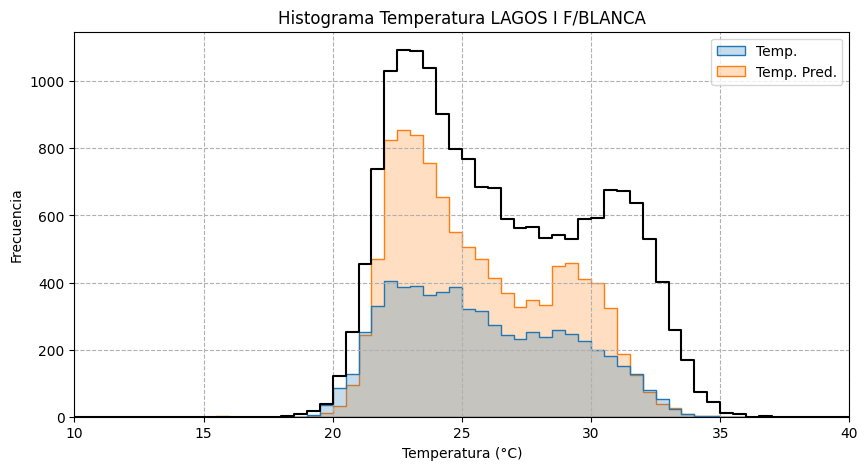

In [ ]:
bins_temp = np.arange(10, 41, 0.5)

plt.figure(figsize=(10, 5))

sns.histplot(data=df_Pred,
             #kde=True,
             fill=True,
             element="step",
             bins=bins_temp)

sns.histplot(data=df_TempHum['EST. SANTA CRUZ GIRÓN TEMPERATURA'],
             #kde=True,
             fill=False,
             element="step",
             bins=bins_temp,
             color='k')

plt.xlabel('Temperatura (°C)')
plt.ylabel('Frecuencia')
plt.title('Histograma Temperatura LAGOS I F/BLANCA')
plt.xlim(10, 40)

plt.grid(ls='--')

plt.show()

El histograma representado con una línea negra corresponde a la estación de Girón.

In [ ]:
df_Pred.iloc[:,1:][df_Pred['Temp.'] > 0].describe().round(2) # Quitando los 0

,Temp.,Temp. Pred.
count,6575.00,6575.00
mean,25.66,25.67
std,3.25,3.07
min,19.20,15.65
25%,23.00,23.09
50%,25.20,25.02
75%,28.30,28.38
max,34.70,34.76


En esta estadística encontramos un comparativo entre los valores predichos y los existentes en la data disponible de Floridablanca. Encontramos una similitud en gran parte de las cifras.

## Histograma filtrado

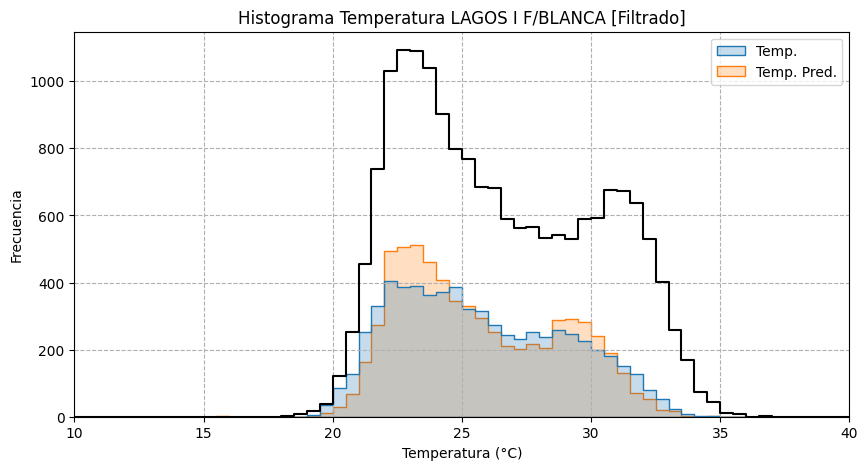

In [ ]:
bins_temp = np.arange(10, 41, 0.5)

plt.figure(figsize=(10, 5))

sns.histplot(data=df_Pred[df_Pred['Temp.'] > 0],
             #kde=True,
             fill=True,
             element="step",
             bins=bins_temp)

sns.histplot(data=df_TempHum['EST. SANTA CRUZ GIRÓN TEMPERATURA'],
             #kde=True,
             fill=False,
             element="step",
             bins=bins_temp,
             color='k')

plt.xlabel('Temperatura (°C)')
plt.ylabel('Frecuencia')
plt.title('Histograma Temperatura LAGOS I F/BLANCA [Filtrado]')
plt.xlim(10, 40)

plt.grid(ls='--')

plt.show()

## Histograma fill

In [ ]:
df_Pred_Fill = df_Pred.copy()
df_Pred_Fill.loc[df_Pred['Temp.'] > 0, 'Temp. Pred.'] = df_Pred_Fill.loc[df_Pred['Temp.'] > 0, 'Temp.']

df_Pred_Fill.columns = ['Fecha', 'Temp.', 'Temp. Fill']

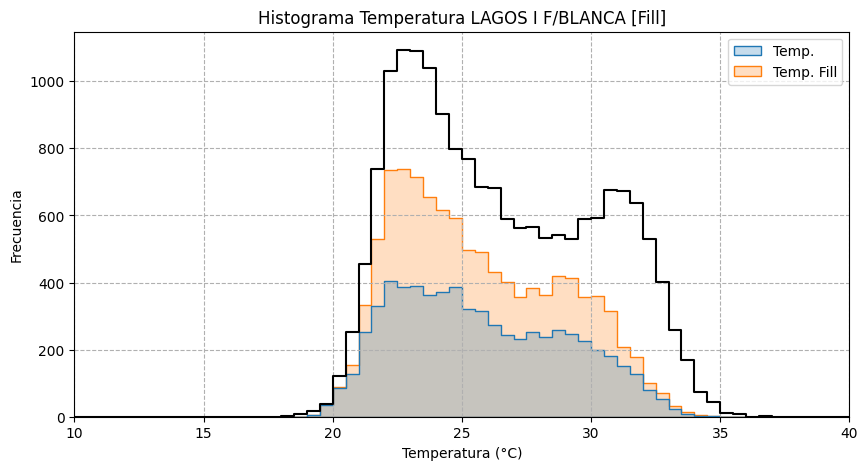

In [ ]:
bins_temp = np.arange(10, 41, 0.5)

plt.figure(figsize=(10, 5))

sns.histplot(data=df_Pred_Fill,
             #kde=True,
             fill=True,
             element="step",
             bins=bins_temp)

sns.histplot(data=df_TempHum['EST. SANTA CRUZ GIRÓN TEMPERATURA'],
             #kde=True,
             fill=False,
             element="step",
             bins=bins_temp,
             color='k')

plt.xlabel('Temperatura (°C)')
plt.ylabel('Frecuencia')
plt.title('Histograma Temperatura LAGOS I F/BLANCA [Fill]')
plt.xlim(10, 40)

plt.grid(ls='--')

plt.show()

# Verificar otras estaciones

Se procederá a contar cuántas estaciones tienen información o están en funcionamiento cada día, para luego graficar esa información a lo largo de toda la temporalidad de las estaciones. El valor máximo esperado será 5, lo que indicará que todas las estaciones cuentan con información para ese día o periodo de tiempo.

In [ ]:
colTemp

['EST. LAGOS I F/BLANCA TEMPERATURA',
 'EST. LACIUDADELA TEMPERATURA',
 'EST. SANTA CRUZ GIRÓN TEMPERATURA',
 'EST. SAN FRANCISCO TEMPERATURA',
 'EST. LAGOS DEL CACIQUE TEMPERATURA']

In [ ]:
df_Temp.fillna(0, inplace=True)
df_Temp['SumaCol'] = 0

for i in colTemp:
  df_Temp['SumaCol'] = df_Temp['SumaCol'] + (df_Temp[i] > 0)

df_Temp['SumaCol'].value_counts()

,count
SumaCol,
5,10924
4,5977
3,963
2,40


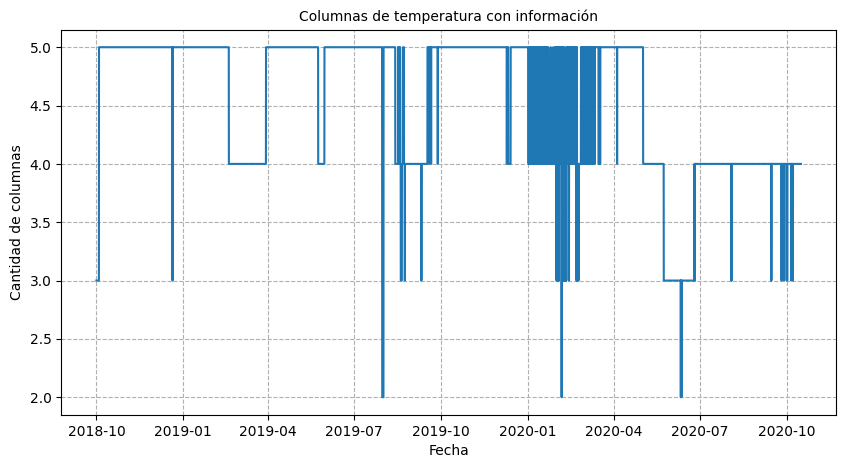

In [ ]:
plt.figure(figsize=(10, 5))

plt.plot(df_Temp['Unnamed: 0'],
          df_Temp['SumaCol'],
          ls='-')

plt.grid(ls='--')
plt.title('Columnas de temperatura con información', fontsize=10)
plt.ylabel('Cantidad de columnas', fontsize=10)
plt.xlabel('Fecha', fontsize=10)

plt.show()

# Fin